In [1]:
import pandas as pd
import sqlite3
import matplotlib.pyplot as plt
import numpy as np
import os

In [2]:
%matplotlib inline

In [3]:
#obtendo dados das keywords
kwBR=pd.read_csv('SeriesKeywords.csv')
kwMG=pd.read_csv('SeriesKeywordsMg.csv')
kwBR

,date,sintomas do covid,covid-19,sintomas do covid 19,dor de garganta,dor de cabeça,perda olfato,olfato e paladar perda,perda de paladar,login caixa auxilio emergencial,...,álcool gel,álcool 70,coronavírus imunidade,respirador mecanico,respirador,respirador hospitalar,medicamento coronavírus,medicamento corona,estou com covid,peguei covid
0,2020-02-23,0,2,1,53,70,1,0,0,0,...,5,5,9,1,8,1,0,4,0,0
1,2020-03-01,0,2,0,47,73,2,0,0,0,...,4,3,0,1,4,0,2,2,0,0
2,2020-03-08,3,8,3,51,72,2,0,0,0,...,12,12,19,1,11,1,17,21,0,0
3,2020-03-15,22,43,20,99,92,5,3,3,0,...,100,100,100,28,52,56,100,100,15,10
4,2020-03-22,20,53,17,100,97,32,20,21,0,...,33,42,48,100,100,100,62,74,12,10
5,2020-03-29,15,54,14,57,93,23,19,31,0,...,13,18,36,54,63,38,15,17,17,0
6,2020-04-05,28,54,26,48,84,29,25,21,35,...,7,10,15,18,37,7,23,17,26,10
7,2020-04-12,86,55,92,46,88,67,53,55,69,...,6,9,26,22,30,5,39,21,35,28
8,2020-04-19,100,49,100,48,96,82,65,73,92,...,4,7,38,21,32,10,23,7,46,9
9,2020-04-26,45,55,37,51,95,100,100,83,100,...,5,5,15,22,43,13,12,14,46,19


In [4]:
#obtendo dados dos indicadores
conn =sqlite3.connect("indicadores.db")
brasilDf=pd.read_sql_query("select * from brazil_df",conn)
statesDf=pd.read_sql_query("select * from states_df",conn)
conn.close()
brasilDf

,week_last_day,epidemiological_week,total_inhabitants,last_available_confirmed,last_available_deaths,new_week_cases,new_week_deaths,prevalence,mortality,lethality,incidence_cases,incidence_deaths,cases_growth_factor,deaths_growth_factor
0,2020-02-29,9,2.117557e+08,2,0,2,0,0.000944,0.000000,0.000000,0.000944,0.000000,0.000000,0.000000
1,2020-03-07,10,2.117557e+08,19,0,17,0,0.008973,0.000000,0.000000,0.008028,0.000000,8.500000,0.000000
2,2020-03-14,11,2.117557e+08,136,0,117,0,0.064225,0.000000,0.000000,0.055252,0.000000,6.882353,0.000000
3,2020-03-21,12,2.117557e+08,1132,18,996,18,0.534578,0.008500,1.590106,0.470353,0.008500,8.512821,0.000000
4,2020-03-28,13,2.117557e+08,3953,115,2821,97,1.866774,0.054308,2.909183,1.332196,0.045808,2.832329,5.388889
5,2020-04-04,14,2.117557e+08,10381,445,6428,330,4.902348,0.210148,4.286678,3.035574,0.155840,2.278625,3.402062
6,2020-04-11,15,2.117557e+08,20991,1141,10610,696,9.912839,0.538828,5.435663,5.010491,0.328681,1.650591,2.109091
7,2020-04-18,16,2.117557e+08,37175,2375,16184,1234,17.555608,1.121576,6.388702,7.642770,0.582747,1.525353,1.772989
8,2020-04-25,17,2.117557e+08,59506,4074,22331,1699,28.101252,1.923915,6.846368,10.545643,0.802340,1.379820,1.376823
9,2020-05-02,18,2.117557e+08,97579,6810,38073,2736,46.080934,3.215970,6.978961,17.979682,1.292055,1.704939,1.610359


In [5]:
#obtendo dados apenas das semanas desejadas dos indicadores
brasilDf=brasilDf.iloc[0:44]
statesDf=statesDf[statesDf['state']=='MG']
statesDf=statesDf.reset_index()
statesDf=statesDf.iloc[0:44]

In [6]:
#criando a coluna de semanas nas keywords
semanas=[]
for i in range(len(kwBR)):
    semanas.append(i+9)
kwMG['epidemiological_week']=semanas
kwBR['epidemiological_week']=semanas

In [7]:
#reordenando colunas para mais facil visualização
cols=kwMG.columns.tolist()
cols=cols[0:1]+cols[-1:]+cols[1:-1]
kwMG=kwMG[cols]
cols=kwBR.columns.tolist()
cols=cols[0:1]+cols[-1:]+cols[1:-1]
kwBR=kwBR[cols]

In [8]:
#normalizando os dados de indicador a serem usados
brasilDf.loc[:,'new_week_cases']=(brasilDf.loc[:,'new_week_cases']/brasilDf.loc[:,'new_week_cases'].max())*100
brasilDf.loc[:,'new_week_deaths']=(brasilDf.loc[:,'new_week_deaths']/brasilDf.loc[:,'new_week_deaths'].max())*100
statesDf.loc[:,'new_week_cases']=(statesDf.loc[:,'new_week_cases']/statesDf.loc[:,'new_week_cases'].max())*100
statesDf.loc[:,'new_week_deaths']=(statesDf.loc[:,'new_week_deaths']/statesDf.loc[:,'new_week_deaths'].max())*100
brasilDf

C:\Users\msart\anaconda3\lib\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


,week_last_day,epidemiological_week,total_inhabitants,last_available_confirmed,last_available_deaths,new_week_cases,new_week_deaths,prevalence,mortality,lethality,incidence_cases,incidence_deaths,cases_growth_factor,deaths_growth_factor
0,2020-02-29,9,2.117557e+08,2,0,0.000600,0.000000,0.000944,0.000000,0.000000,0.000944,0.000000,0.000000,0.000000
1,2020-03-07,10,2.117557e+08,19,0,0.005100,0.000000,0.008973,0.000000,0.000000,0.008028,0.000000,8.500000,0.000000
2,2020-03-14,11,2.117557e+08,136,0,0.035097,0.000000,0.064225,0.000000,0.000000,0.055252,0.000000,6.882353,0.000000
3,2020-03-21,12,2.117557e+08,1132,18,0.298777,0.234803,0.534578,0.008500,1.590106,0.470353,0.008500,8.512821,0.000000
4,2020-03-28,13,2.117557e+08,3953,115,0.846235,1.265327,1.866774,0.054308,2.909183,1.332196,0.045808,2.832329,5.388889
5,2020-04-04,14,2.117557e+08,10381,445,1.928252,4.304722,4.902348,0.210148,4.286678,3.035574,0.155840,2.278625,3.402062
6,2020-04-11,15,2.117557e+08,20991,1141,3.182755,9.079050,9.912839,0.538828,5.435663,5.010491,0.328681,1.650591,2.109091
7,2020-04-18,16,2.117557e+08,37175,2375,4.854826,16.097052,17.555608,1.121576,6.388702,7.642770,0.582747,1.525353,1.772989
8,2020-04-25,17,2.117557e+08,59506,4074,6.698784,22.162797,28.101252,1.923915,6.846368,10.545643,0.802340,1.379820,1.376823
9,2020-05-02,18,2.117557e+08,97579,6810,11.421021,35.690060,46.080934,3.215970,6.978961,17.979682,1.292055,1.704939,1.610359


In [9]:
#extraindo apenas dados necessários das databases
brasilDf=brasilDf.set_index('epidemiological_week')
statesDf=statesDf.set_index('epidemiological_week')
brasilDf=brasilDf[['new_week_cases','new_week_deaths']]
statesDf=statesDf[['new_week_cases','new_week_deaths']]
kwBR=kwBR.set_index('epidemiological_week')
kwMG=kwMG.set_index('epidemiological_week')
kwBR=kwBR.drop('date',axis=1)
kwMG=kwMG.drop('date',axis=1)

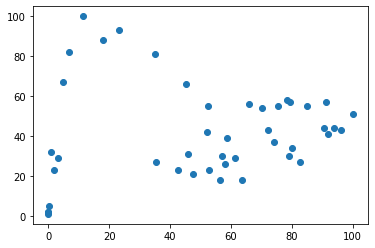

In [10]:
#exemplo de scatterplot
plt.scatter(brasilDf['new_week_cases'],kwBR['perda olfato'])
plt.show()

In [11]:
#criando as dataframes que irão armazenar correlações
aux=np.zeros((124,4))
cols=kwBR.columns.tolist()
pearsonCorr=pd.DataFrame(aux,columns=['Brasil_newCases','Brasil_newDeaths','MG_newCases','MG_newDeaths'])
pearsonCorr['keyword']=cols
pearsonCorr=pearsonCorr.set_index('keyword')
spearmanCorr=pd.DataFrame(aux,columns=['Brasil_newCases','Brasil_newDeaths','MG_newCases','MG_newDeaths'])   
spearmanCorr['keyword']=cols
spearmanCorr=spearmanCorr.set_index('keyword')

In [12]:
#calculando as correlações de pearson
count=0
for i in kwBR:
    pearsonCorr.loc[count:count+1,'Brasil_newCases']=kwBR[i].corr(brasilDf['new_week_cases'],method='pearson')
    pearsonCorr.loc[count:count+1,'Brasil_newDeaths']=kwBR[i].corr(brasilDf['new_week_deaths'],method='pearson')
    pearsonCorr.loc[count:count+1,'MG_newCases']=kwBR[i].corr(statesDf['new_week_cases'],method='pearson')
    pearsonCorr.loc[count:count+1,'MG_newDeaths']=kwBR[i].corr(statesDf['new_week_deaths'],method='pearson')
    count+=1

C:\Users\msart\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  after removing the cwd from sys.path.
C:\Users\msart\anaconda3\lib\site-packages\ipykernel_launcher.py:5: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  """
C:\Users\msart\anaconda3\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  
C:\Users\msart\anaconda3\lib\site-packages\ipykernel_launcher.py:7: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions inst

In [13]:
#calculando as correlações de spearman
count=0
for i in kwMG:
    spearmanCorr.loc[count:count+1,'Brasil_newCases']=kwBR[i].corr(brasilDf['new_week_cases'],method='spearman')
    spearmanCorr.loc[count:count+1,'Brasil_newDeaths']=kwBR[i].corr(brasilDf['new_week_deaths'],method='spearman')
    spearmanCorr.loc[count:count+1,'MG_newCases']=kwBR[i].corr(statesDf['new_week_cases'],method='spearman')
    spearmanCorr.loc[count:count+1,'MG_newDeaths']=kwBR[i].corr(statesDf['new_week_deaths'],method='spearman')
    count+=1

C:\Users\msart\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  after removing the cwd from sys.path.
C:\Users\msart\anaconda3\lib\site-packages\ipykernel_launcher.py:5: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  """
C:\Users\msart\anaconda3\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  
C:\Users\msart\anaconda3\lib\site-packages\ipykernel_launcher.py:7: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions inst

In [14]:
pearsonCorr.sort_values(by='Brasil_newCases',ascending=False)

,Brasil_newCases,Brasil_newDeaths,MG_newCases,MG_newDeaths
keyword,,,,
pcr exame covid,0.896415,0.649151,0.845073,0.640363
reagente igg,0.894500,0.839404,0.742968,0.675365
exame covid,0.876625,0.747392,0.768465,0.578561
covid pcr,0.856093,0.605336,0.846007,0.639075
pcr,0.834313,0.556693,0.844086,0.619644
...,...,...,...,...
máscara n95,-0.650217,-0.515737,-0.649950,-0.643368
coronavírus quarentena,-0.661143,-0.518442,-0.641886,-0.613939
coronavírus no brasil,-0.687445,-0.532589,-0.677260,-0.649942


In [15]:
spearmanCorr.sort_values(by='Brasil_newCases',ascending=False)

,Brasil_newCases,Brasil_newDeaths,MG_newCases,MG_newDeaths
keyword,,,,
pcr,0.908719,0.612292,0.836542,0.685087
pcr exame covid,0.895973,0.621359,0.816095,0.648996
covid pcr,0.874167,0.585423,0.799732,0.638930
reagente igg,0.862249,0.815272,0.766576,0.688446
exame covid,0.852328,0.717202,0.735811,0.548867
...,...,...,...,...
ministerio da saude,-0.573034,-0.120485,-0.700941,-0.657291
corona grupo de risco,-0.584466,-0.214753,-0.681841,-0.683798
oms corona,-0.587992,-0.232730,-0.754384,-0.750949


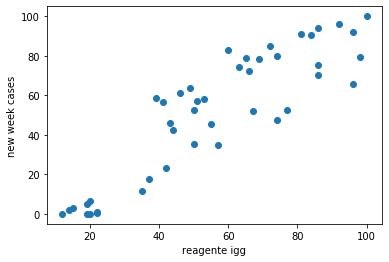

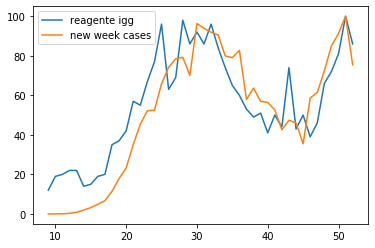

In [16]:
#plotando graficos de um dos pontos com alta correlação de pearson
plt.scatter(kwBR['reagente igg'],brasilDf['new_week_cases'])
plt.xlabel('reagente igg')
plt.ylabel('new week cases')
plt.show()
plt.plot(kwBR['reagente igg'],label='reagente igg')
plt.plot(brasilDf['new_week_cases'],label='new week cases')
plt.legend(loc="upper left")
plt.show()

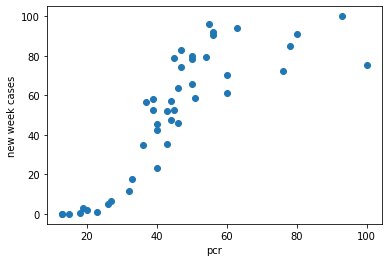

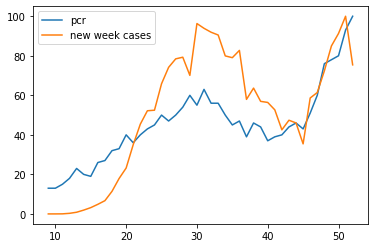

In [17]:
#plotando graficos de um dos pontos com alta correlação de spearman
plt.scatter(kwBR['pcr'],brasilDf['new_week_cases'])
plt.xlabel('pcr')
plt.ylabel('new week cases')
plt.show()
plt.plot(kwBR['pcr'],label='pcr')
plt.plot(brasilDf['new_week_cases'],label='new week cases')
plt.legend(loc="upper left")
plt.show()

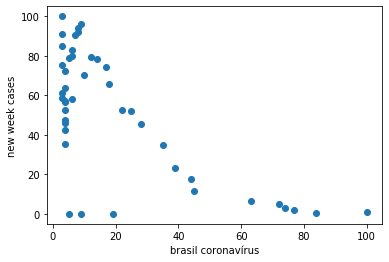

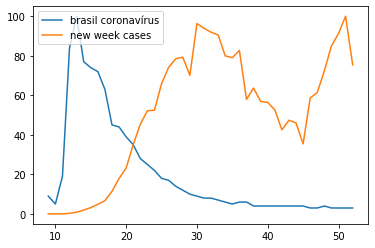

In [18]:
#plotando grafico de uma correlação negativa
plt.scatter(kwBR['brasil coronavírus'],brasilDf['new_week_cases'])
plt.xlabel('brasil coronavírus')
plt.ylabel('new week cases')
plt.show()
plt.plot(kwBR['brasil coronavírus'],label='brasil coronavírus')
plt.plot(brasilDf['new_week_cases'],label='new week cases')
plt.legend(loc="upper left")
plt.show()

In [19]:
cat=pd.read_csv('Queries categorizadas.csv')
cat=cat.drop('Unnamed: 0',axis=1)
cat.head()

,referencia,query,Categoria,Subcategoria
0,erupção cutânea,sintomas do covid,Sintoma,geral
1,erupção cutânea,covid-19,Vírus ou Doença,geral
2,erupção cutânea,sintomas do covid 19,Sintoma,geral
3,dor de garganta,dor de garganta,Sintoma,gripais
4,dor de cabeça,dor de cabeça,Sintoma,geral


In [20]:
#encontrando os sintomas entre as keywords
sintomas=cat[cat['Categoria']=='Sintoma']
del cat
sintomas

,referencia,query,Categoria,Subcategoria
0,erupção cutânea,sintomas do covid,Sintoma,geral
2,erupção cutânea,sintomas do covid 19,Sintoma,geral
3,dor de garganta,dor de garganta,Sintoma,gripais
4,dor de cabeça,dor de cabeça,Sintoma,geral
5,olfato,perda olfato,Sintoma,específicos
6,olfato,olfato e paladar perda,Sintoma,específicos
7,olfato,perda de paladar,Sintoma,específicos
14,paladar,olfato,Sintoma,específicos
15,paladar,paladar e olfato,Sintoma,específicos
16,paladar,covid 19 sintomas,Sintoma,geral


In [21]:
#criando pastas para salvar os gráficos 
parent_dir = os.getcwd()
aux='Sintomas'
path = os.path.join(parent_dir, aux)
try:
    os.mkdir(path)
except:
    print('Pasta já existe')
directory = aux+'\\Brasil_newCases'
path = os.path.join(parent_dir, directory)
try:
    os.mkdir(path)
except:
    print('Pasta já existe')
directory =aux+'\\Brasil_newDeaths'
path = os.path.join(parent_dir, directory)
try:
    os.mkdir(path)
except:
    print('Pasta já existe')
directory =aux + '\\MG_newCases'
path = os.path.join(parent_dir, directory)
try:
    os.mkdir(path)
except:
    print('Pasta já existe')
directory = aux + '\\MG_newDeaths'
path = os.path.join(parent_dir, directory)
try:
    os.mkdir(path)
except:
    print('Pasta já existe')

Pasta já existe
Pasta já existe
Pasta já existe
Pasta já existe
Pasta já existe


In [22]:
#manipulando os dataframes para permitir a mais facil iteração
brasilDf2=brasilDf[['new_week_cases','new_week_deaths']]
statesDf2=statesDf[['new_week_cases','new_week_deaths']]

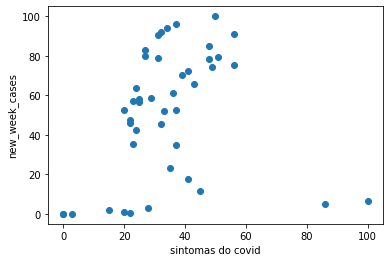

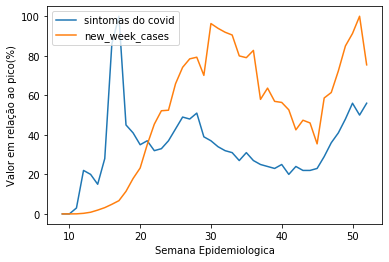

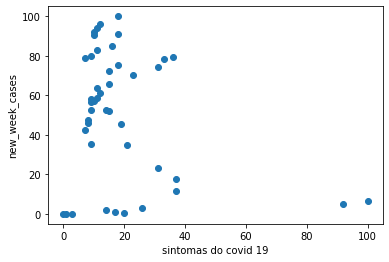

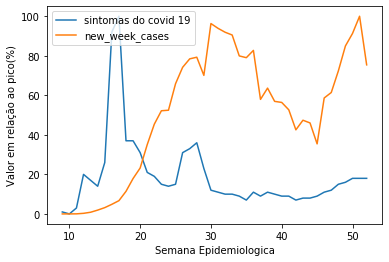

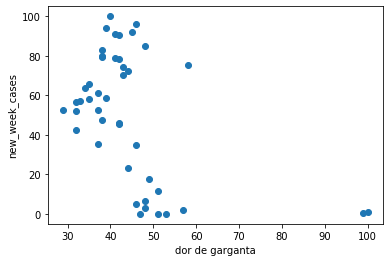

...

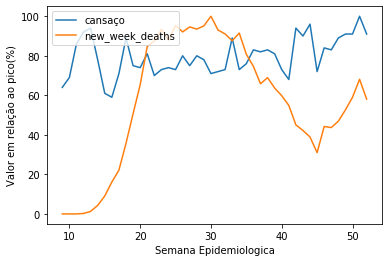

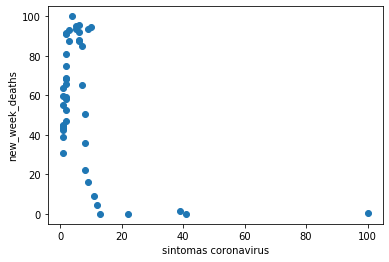

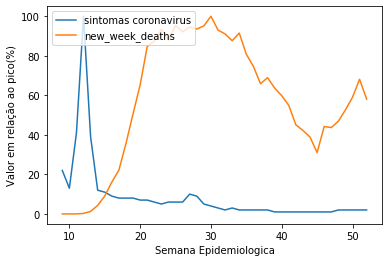

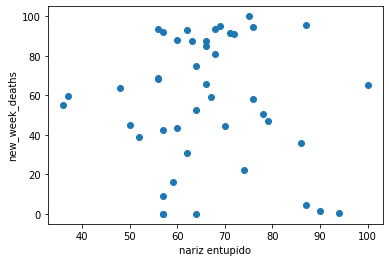

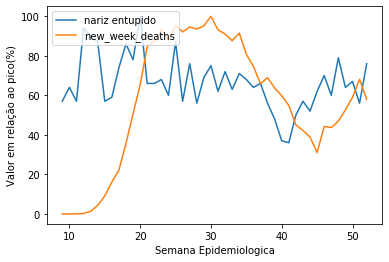

<Figure size 432x288 with 0 Axes>

In [23]:
#plotando os gráficos de sintomas do brasil
directory='Sintomas\\'
for i in brasilDf2:
    for j in sintomas['query']:
        plt.scatter(kwBR[j],brasilDf2[i])
        plt.xlabel(j)
        plt.ylabel(i)
        if(i=='new_week_cases'):
            plt.savefig(directory+'Brasil_newCases\\'+j+'_scatter.png')
        else:
            plt.savefig(directory+'Brasil_newDeaths\\'+j+'_scatter.png')
        plt.show()
        plt.clf()
        plt.plot(kwBR[j],label=j)
        plt.plot(brasilDf[i],label=i)
        plt.xlabel('Semana Epidemiologica')
        plt.ylabel('Valor em relação ao pico(%)')
        plt.legend(loc="upper left")
        if(i=='new_week_cases'):
            plt.savefig(directory+'Brasil_newCases\\'+j+'_line.png')
        else:
            plt.savefig(directory+'Brasil_newDeaths\\'+j+'_line.png')
        plt.show()
        plt.clf()

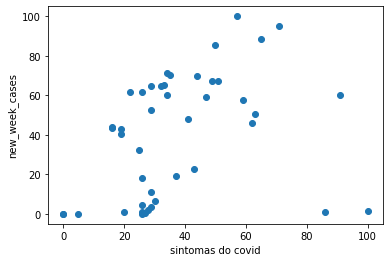

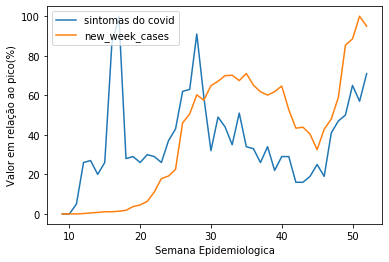

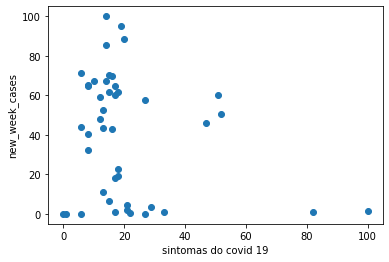

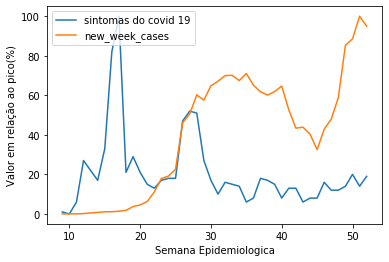

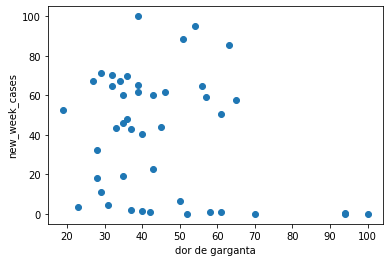

...

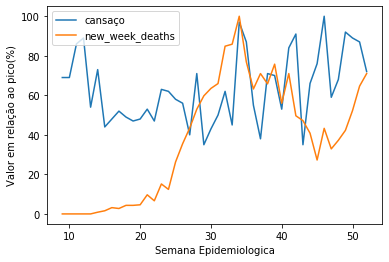

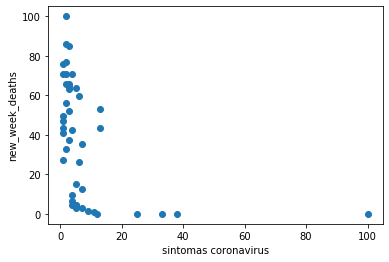

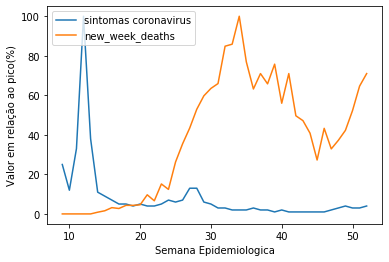

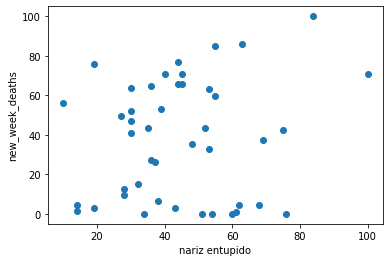

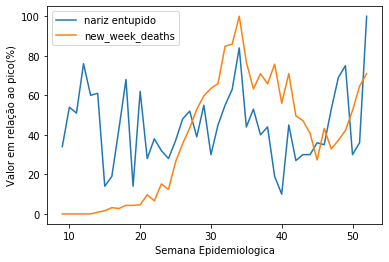

<Figure size 432x288 with 0 Axes>

In [24]:
#plotando os gráficos de sintomas de MG
directory='Sintomas\\'
for i in statesDf2:
    for j in sintomas['query']:
        plt.scatter(kwMG[j],statesDf2[i])
        plt.xlabel(j)
        plt.ylabel(i)
        if(i=='new_week_cases'):
            plt.savefig(directory+'MG_newCases\\'+j+'_scatter.png')
        else:
            plt.savefig(directory+'MG_newDeaths\\'+j+'_scatter.png')
        plt.show()
        plt.clf()
        plt.plot(kwMG[j],label=j)
        plt.plot(statesDf[i],label=i)
        plt.xlabel('Semana Epidemiologica')
        plt.ylabel('Valor em relação ao pico(%)')
        plt.legend(loc="upper left")
        if(i=='new_week_cases'):
            plt.savefig(directory+'MG_newCases\\'+j+'_line.png')
        else:
            plt.savefig(directory+'MG_newDeaths\\'+j+'_line.png')
        plt.show()
        plt.clf()

In [25]:
#função que será usada para tratar a matriz gerada mais a frente
def dropy(df):
    for i in df:
        if i.endswith('_y'):
            df=df.drop(i,axis=1)
        elif i.endswith('_x'):
            df=df.rename(columns={i:i.replace('_x','')})
    return df

In [26]:
#função para gerar matriz com apenas valores em uma faixa de correlação
def corrMatrix(lim,lim2,Corr):
    brnwd=Corr[(abs(Corr['Brasil_newDeaths'])>=lim) & (abs(Corr['Brasil_newDeaths'])<lim2)]['Brasil_newDeaths'].reset_index()
    brnwc=Corr[(abs(Corr['Brasil_newCases'])>=lim) & (abs(Corr['Brasil_newCases'])<lim2)]['Brasil_newCases'].reset_index()
    mgnwc=Corr[(abs(Corr['MG_newCases'])>=lim )& (abs(Corr['MG_newCases'])<lim2)]['MG_newCases'].reset_index()
    mgnwd=Corr[(abs(Corr['MG_newDeaths'])>=lim )& (abs(Corr['MG_newDeaths'])<lim2)]['MG_newDeaths'].reset_index()
    matrix=pd.merge(brnwd, brnwc, how="outer", on=["keyword", "keyword"])
    matrix=pd.merge(matrix,mgnwc,how="outer",on=["keyword", "keyword"])
    matrix=pd.merge(matrix,mgnwd,how="outer",on=["keyword", "keyword"])
    matrix=dropy(matrix)
    return matrix

In [27]:
#criando as matrizes com altas, medias e baixas correlações
highS=corrMatrix(0.7,1.1,spearmanCorr)
highP=corrMatrix(0.7,1.1,pearsonCorr)
medS=corrMatrix(0.5,0.7,spearmanCorr)
medP=corrMatrix(0.5,0.7,pearsonCorr)
lowS=corrMatrix(0,0.5,spearmanCorr)
lowP=corrMatrix(0,0.5,pearsonCorr)

In [28]:
#criando a pasta para as matrizes e salvando elas em spreadsheets
directory='Correlations'
path = os.path.join(parent_dir, directory)
try:
    os.mkdir(path)
except:
    print('Pasta já existe')
highS.to_excel(directory+"\\highSpearman.xlsx")
medS.to_excel(directory+"\\mediumSpearman.xlsx")
lowS.to_excel(directory+"\\lowSpearman.xlsx")
highP.to_excel(directory+"\\highPearson.xlsx")
medP.to_excel(directory+"\\medPearson.xlsx")
lowP.to_excel(directory+"\\lowPearson.xlsx")
del highS
del medS
del lowS
del highP
del medP
del lowP

Pasta já existe


In [29]:
#função que plota os top10 valores negativos e positivos de cada categoria
def plot10(series,kw,ind,cat,path):
    plot=abs(series)
    plot=plot.sort_values(ascending=False)[0:10]
    plot=plot.reset_index()
    count=0
    print('Top10 maiores')
    for i in plot['keyword']:
        count+=1
        plt.scatter(kw[i],ind)
        plt.xlabel(i)
        plt.ylabel(cat)
        plt.show()
        plt.plot(kwMG[i],label=i)
        plt.plot(ind,label=cat)
        plt.xlabel('Semana Epidemiologica')
        plt.ylabel('Valor em relação ao pico(%)')
        plt.legend()
        plt.savefig(path+'\\'+str(count)+'° maior.png')
        plt.show()
        plt.clf()

In [30]:
#criando pastas para salvar os top 10 gráficos 
parent_dir = os.getcwd()
aux='Top10'
path = os.path.join(parent_dir, aux)
try:
    os.mkdir(path)
except:
    print('Pasta já existe')
directory = aux+'\\Brasil_newCases'
path = os.path.join(parent_dir, directory)
try:
    os.mkdir(path)
except:
    print('Pasta já existe')
directory =aux+'\\Brasil_newDeaths'
path = os.path.join(parent_dir, directory)
try:
    os.mkdir(path)
except:
    print('Pasta já existe')
directory =aux + '\\MG_newCases'
path = os.path.join(parent_dir, directory)
try:
    os.mkdir(path)
except:
    print('Pasta já existe')
directory = aux + '\\MG_newDeaths'
path = os.path.join(parent_dir, directory)
try:
    os.mkdir(path)
except:
    print('Pasta já existe')

In [31]:
#plotando as de pearson
#plot10(pearsonCorr['Brasil_newCases'],kwBR,brasilDf['new_week_cases'],'new_week_cases')
#plot10(pearsonCorr['Brasil_newDeaths'],kwBR,brasilDf['new_week_deaths'],'new_week_deaths')
#plot10(pearsonCorr['MG_newCases'],kwMG,statesDf['new_week_cases'],'new_week_cases')
#plot10(pearsonCorr['MG_newDeaths'],kwMG,statesDf['new_week_deaths'],'new_week_deaths')

Top10 maiores


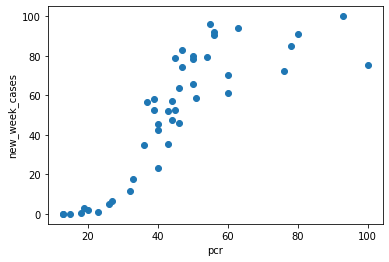

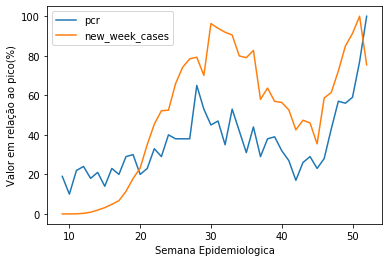

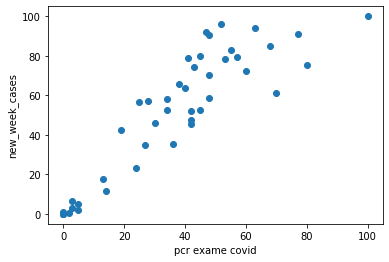

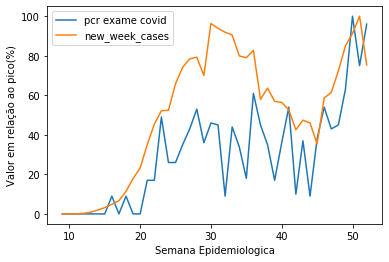

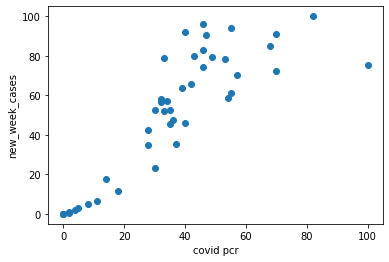

...

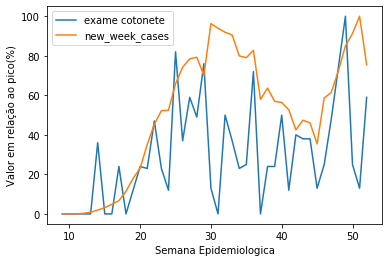

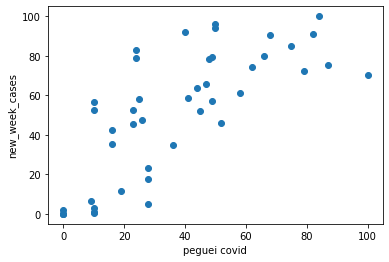

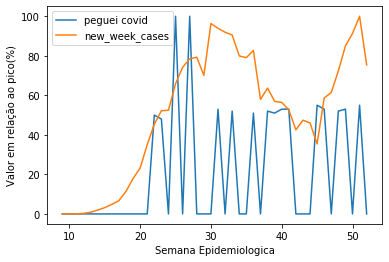

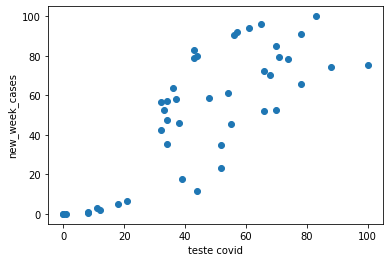

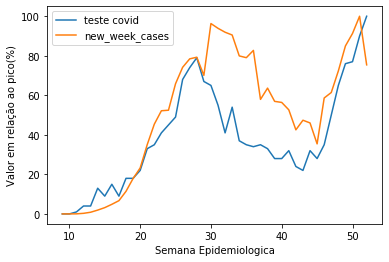

Top10 maiores


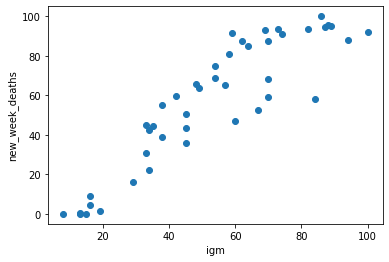

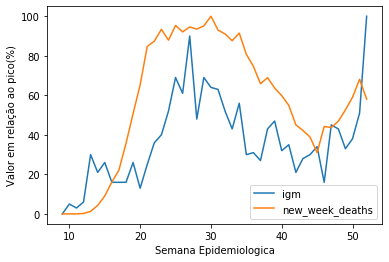

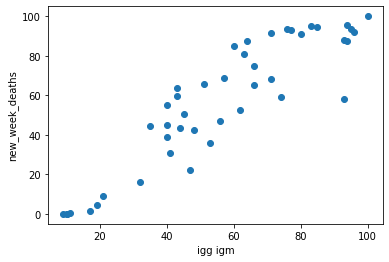

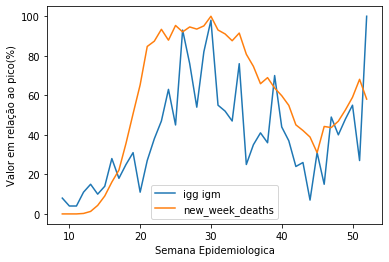

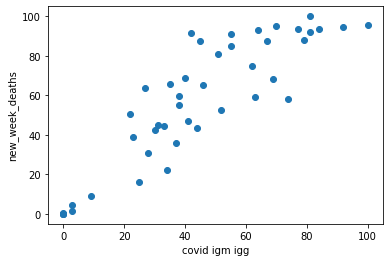

...

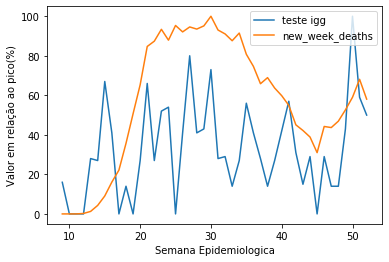

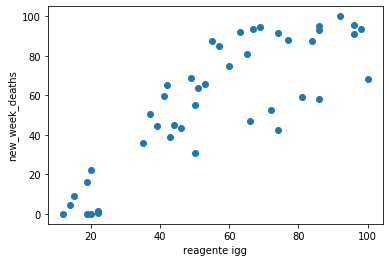

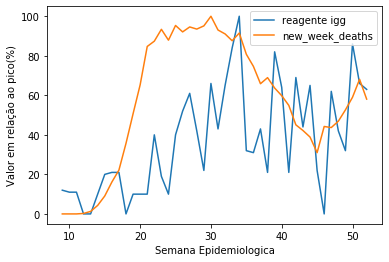

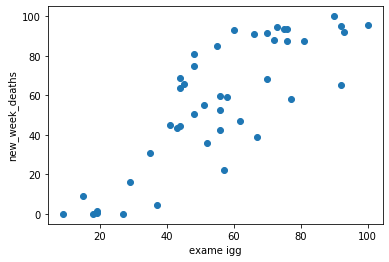

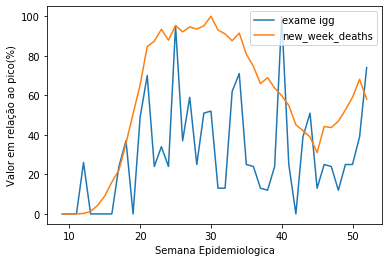

Top10 maiores


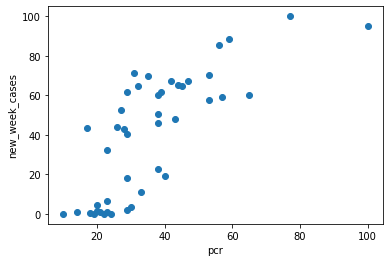

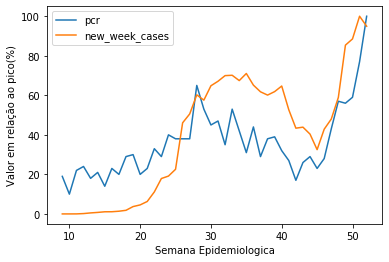

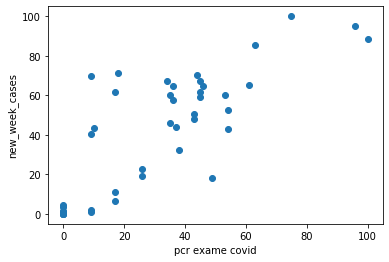

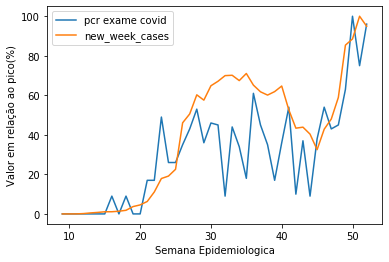

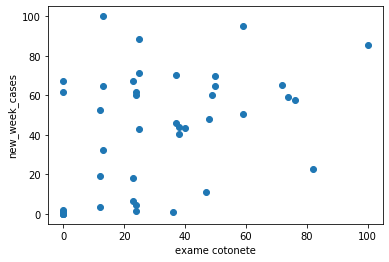

...

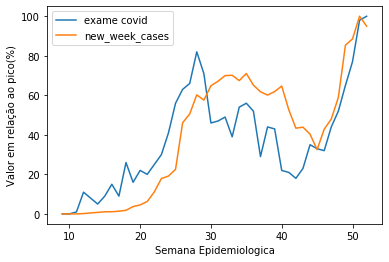

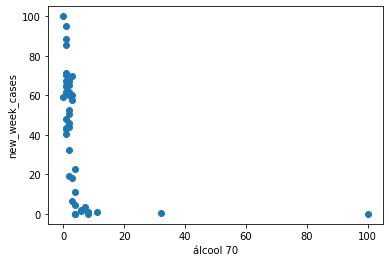

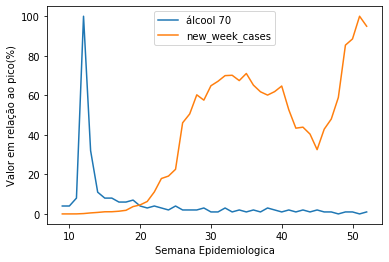

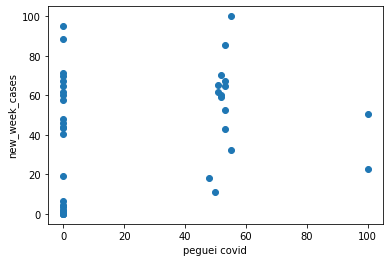

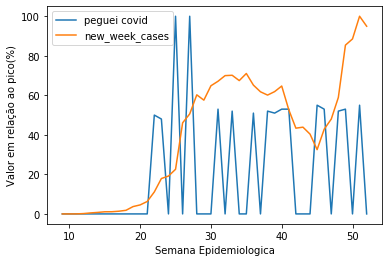

Top10 maiores


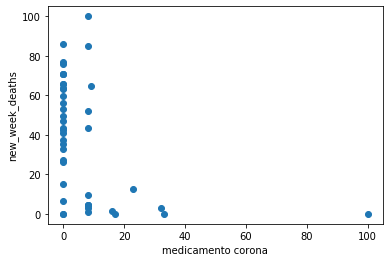

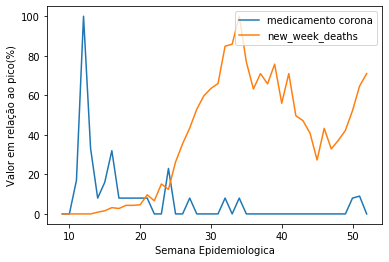

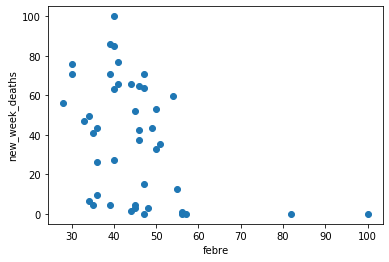

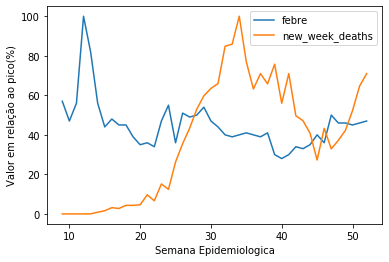

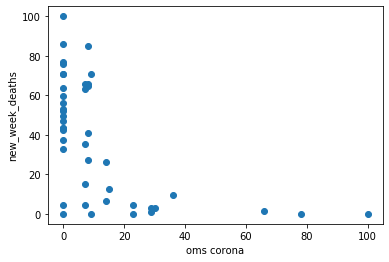

...

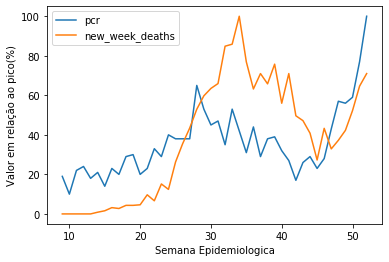

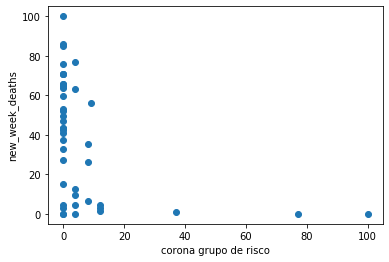

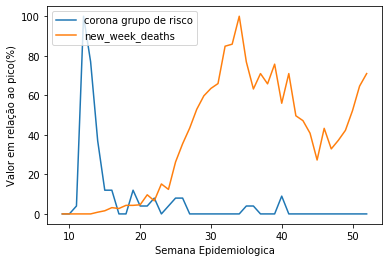

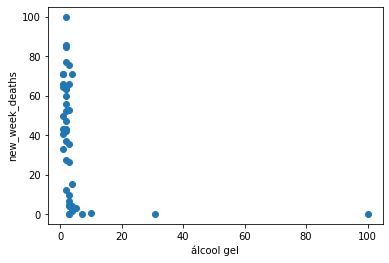

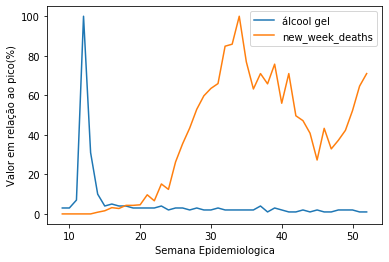

<Figure size 432x288 with 0 Axes>

In [32]:
#plotando os top10 de spearman
plot10(spearmanCorr['Brasil_newCases'].copy(),kwBR,brasilDf['new_week_cases'],'new_week_cases','Top10\\Brasil_newCases')
plot10(spearmanCorr['Brasil_newDeaths'].copy(),kwBR,brasilDf['new_week_deaths'],'new_week_deaths','Top10\\Brasil_newDeaths')
plot10(spearmanCorr['MG_newCases'].copy(),kwMG,statesDf['new_week_cases'],'new_week_cases','Top10\\MG_newCases')
plot10(spearmanCorr['MG_newDeaths'].copy(),kwMG,statesDf['new_week_deaths'],'new_week_deaths','Top10\\MG_newDeaths')

In [33]:
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.patheffects as PathEffects
#from packed_bubbles import BubbleChart

In [34]:
#código para bubble plot, baseado em: https://matplotlib.org/devdocs/gallery/misc/packed_bubbles.html
#com algumas modificações relativas às fontes usadas para as legendas
class BubbleChart:
    def __init__(self, area, bubble_spacing=0):
        """
        Setup for bubble collapse.

        Parameters
        ----------
        area : array-like
            Area of the bubbles.
        bubble_spacing : float, default: 0
            Minimal spacing between bubbles after collapsing.

        Notes
        -----
        If "area" is sorted, the results might look weird.
        """
        area = np.asarray(area)
        r = np.sqrt(area / np.pi)

        self.bubble_spacing = bubble_spacing
        self.bubbles = np.ones((len(area), 4))
        self.bubbles[:, 2] = r
        self.bubbles[:, 3] = area
        self.maxstep = 2 * self.bubbles[:, 2].max() + self.bubble_spacing
        self.step_dist = self.maxstep / 2

        # calculate initial grid layout for bubbles
        length = np.ceil(np.sqrt(len(self.bubbles)))
        grid = np.arange(length) * self.maxstep
        gx, gy = np.meshgrid(grid, grid)
        self.bubbles[:, 0] = gx.flatten()[:len(self.bubbles)]
        self.bubbles[:, 1] = gy.flatten()[:len(self.bubbles)]

        self.com = self.center_of_mass()

    def center_of_mass(self):
        return np.average(
            self.bubbles[:, :2], axis=0, weights=self.bubbles[:, 3]
        )

    def center_distance(self, bubble, bubbles):
        return np.hypot(bubble[0] - bubbles[:, 0],
                        bubble[1] - bubbles[:, 1])

    def outline_distance(self, bubble, bubbles):
        center_distance = self.center_distance(bubble, bubbles)
        return center_distance - bubble[2] - \
            bubbles[:, 2] - self.bubble_spacing

    def check_collisions(self, bubble, bubbles):
        distance = self.outline_distance(bubble, bubbles)
        return len(distance[distance < 0])

    def collides_with(self, bubble, bubbles):
        distance = self.outline_distance(bubble, bubbles)
        idx_min = np.argmin(distance)
        return idx_min if type(idx_min) == np.ndarray else [idx_min]

    def collapse(self, n_iterations=50):
        """
        Move bubbles to the center of mass.

        Parameters
        ----------
        n_iterations : int, default: 50
            Number of moves to perform.
        """
        for _i in range(n_iterations):
            moves = 0
            for i in range(len(self.bubbles)):
                rest_bub = np.delete(self.bubbles, i, 0)
                # try to move directly towards the center of mass
                # direction vector from bubble to the center of mass
                dir_vec = self.com - self.bubbles[i, :2]

                # shorten direction vector to have length of 1
                dir_vec = dir_vec / np.sqrt(dir_vec.dot(dir_vec))

                # calculate new bubble position
                new_point = self.bubbles[i, :2] + dir_vec * self.step_dist
                new_bubble = np.append(new_point, self.bubbles[i, 2:4])

                # check whether new bubble collides with other bubbles
                if not self.check_collisions(new_bubble, rest_bub):
                    self.bubbles[i, :] = new_bubble
                    self.com = self.center_of_mass()
                    moves += 1
                else:
                    # try to move around a bubble that you collide with
                    # find colliding bubble
                    for colliding in self.collides_with(new_bubble, rest_bub):
                        # calculate direction vector
                        dir_vec = rest_bub[colliding, :2] - self.bubbles[i, :2]
                        dir_vec = dir_vec / np.sqrt(dir_vec.dot(dir_vec))
                        # calculate orthogonal vector
                        orth = np.array([dir_vec[1], -dir_vec[0]])
                        # test which direction to go
                        new_point1 = (self.bubbles[i, :2] + orth *
                                      self.step_dist)
                        new_point2 = (self.bubbles[i, :2] - orth *
                                      self.step_dist)
                        dist1 = self.center_distance(
                            self.com, np.array([new_point1]))
                        dist2 = self.center_distance(
                            self.com, np.array([new_point2]))
                        new_point = new_point1 if dist1 < dist2 else new_point2
                        new_bubble = np.append(new_point, self.bubbles[i, 2:4])
                        if not self.check_collisions(new_bubble, rest_bub):
                            self.bubbles[i, :] = new_bubble
                            self.com = self.center_of_mass()

            if moves / len(self.bubbles) < 0.1:
                self.step_dist = self.step_dist / 2

    def plot(self, ax, labels, colors):
        """
        Draw the bubble plot.

        Parameters
        ----------
        ax : matplotlib.axes.Axes
        labels : list
            Labels of the bubbles.
        colors : list
            Colors of the bubbles.
        """
        for i in range(len(self.bubbles)):
            circ = plt.Circle(
                self.bubbles[i, :2], self.bubbles[i, 2], color=colors[i])
            ax.add_patch(circ)
            txt=ax.text(*self.bubbles[i, :2], labels[i],
                    horizontalalignment='center', verticalalignment='center',fontsize=12,color='w')
            txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='k'), PathEffects.Normal()])


In [35]:
def f2hex(f2rgb, f):
    rgb = f2rgb.to_rgba(f)[:3]
    return '#%02x%02x%02x' % tuple([int(255*fc) for fc in rgb])

In [36]:
def color(corr,ind):#função responsável por obter as cores para as bolhas, no caso azul para positivos,vermelho para negativos
    corr['color']=1 #pode-se mudar os color maps a qualquer momento, basta mudar blues e reds para o colormap escolhido
    aux=corr[corr[ind]>0].copy()
    norm1=colors.Normalize(vmin=0,vmax=aux[ind].max())
    f2rgb = cm.ScalarMappable(norm=norm1, cmap=cm.get_cmap('Blues'))
    for i in range(len(aux)):
        aux['color'].iloc[i]=f2hex(f2rgb,aux[ind].iloc[i])
    corr[corr[ind]>0]=aux.copy()
    aux=corr[corr[ind]<=0].copy()
    aux[ind]=abs(aux[ind])
    norm2=colors.Normalize(vmin=0,vmax=aux[ind].max())
    f2rgb = cm.ScalarMappable(norm=norm2, cmap=cm.get_cmap('Reds'))
    for i in range(len(aux)):
        aux['color'].iloc[i]=f2hex(f2rgb,aux[ind].iloc[i])
    corr[corr[ind]<=0]=aux.copy()
    return corr

In [37]:
#função que plota um único bubblechart a partir de um indicador(string) e um dataframe
def plot(corr,ind):
    corr[ind]=pd.to_numeric(corr[ind]*100, downcast='integer').astype(int) #arredonda os valores para inteiros                                                                          #utilizando as 2 primeiras casas decimais
    corr=color(corr,ind)                                                #necessário para o bubblechart e a escolha de cores
    corr=corr[corr[ind]>=50]
    corr = corr.reset_index(drop=True)
    bubble_chart = BubbleChart(area=corr[ind],
                               bubble_spacing=0.1)
    bubble_chart.collapse()

    fig, ax = plt.subplots(subplot_kw=dict(aspect="equal"),figsize=(20, 20))
    bubble_chart.plot(
        ax, corr['keyword'],corr['color'])
    ax.axis("off")
    ax.relim()
    ax.autoscale_view()
    ax.set_title(ind,fontsize='18')
    plt.savefig('Bubble\\'+ind+'.png')
    plt.show()

In [38]:
def plotAll(corr):#plota de todos indicadores de um dos dataframes de correlação
    corr=corr.reset_index()
    plot(corr.copy(),'Brasil_newCases')
    plot(corr.copy(),'Brasil_newDeaths')
    plot(corr.copy(),'MG_newCases')
    plot(corr.copy(),'MG_newDeaths')

In [39]:
#criando pastas para salvar os bubblegraphs
parent_dir = os.getcwd()
path='Bubble'
path = os.path.join(parent_dir, path)
try:
    os.mkdir(path)
except:
    print('Pasta já existe')

Pasta já existe


C:\Users\msart\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\Users\msart\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


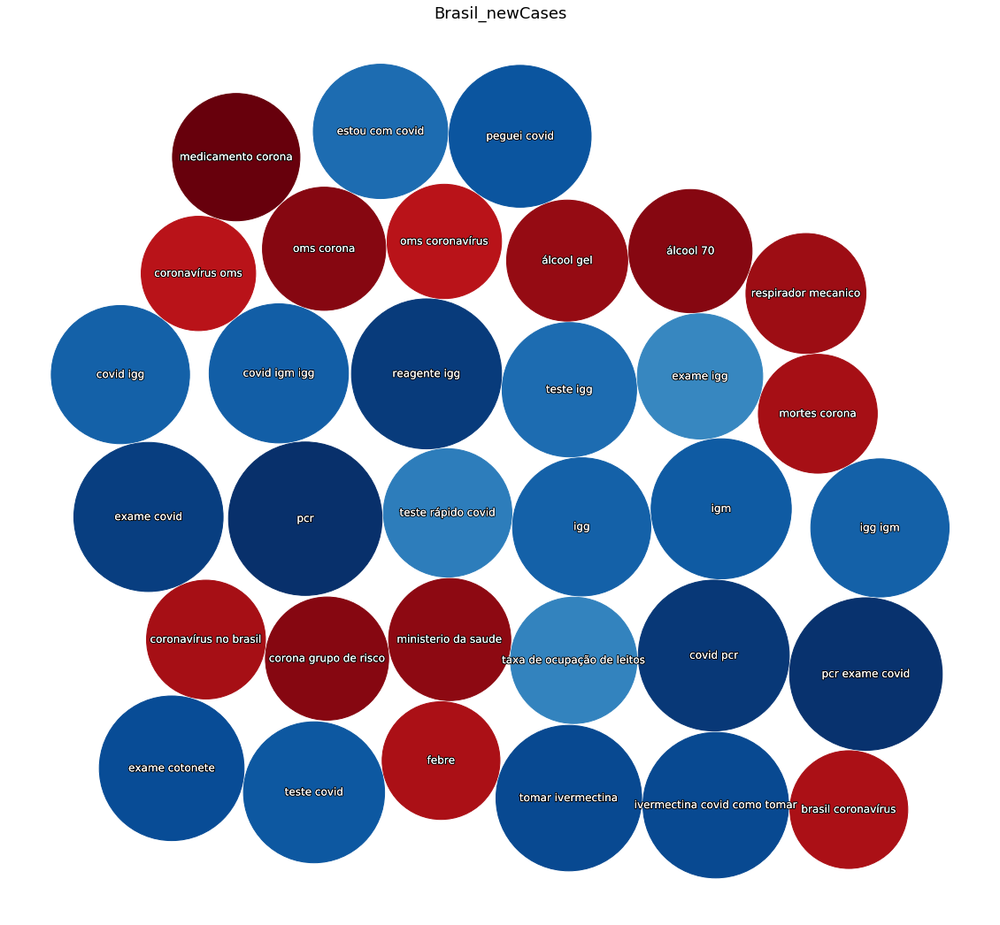

C:\Users\msart\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\Users\msart\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


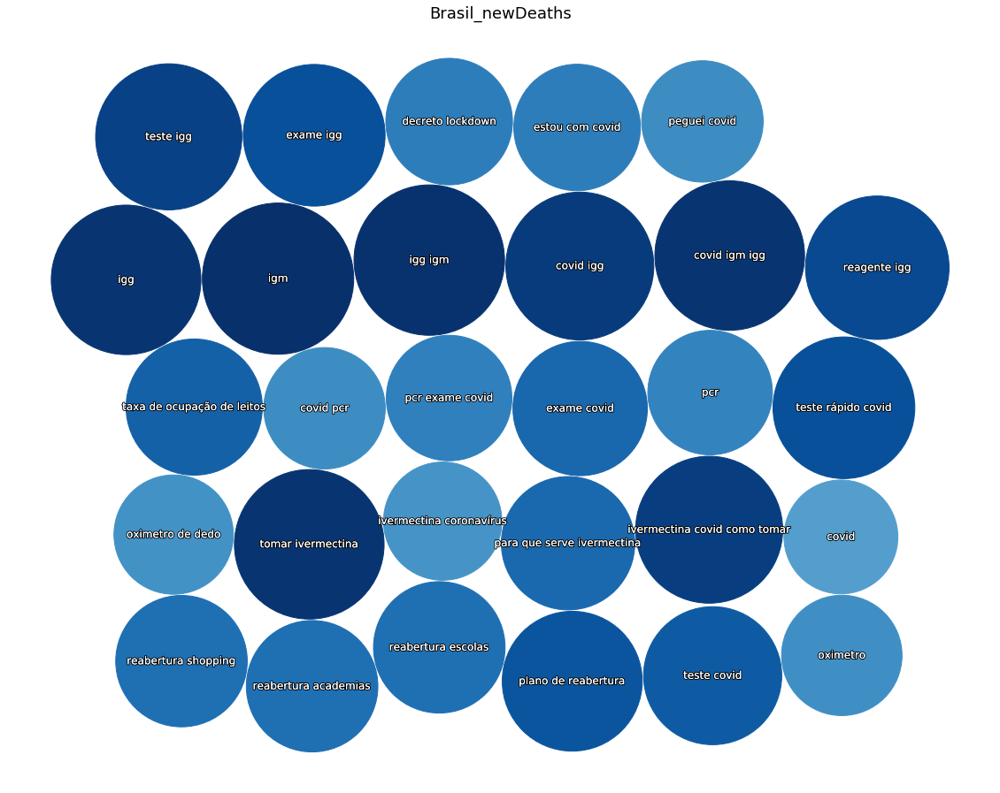

C:\Users\msart\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\Users\msart\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


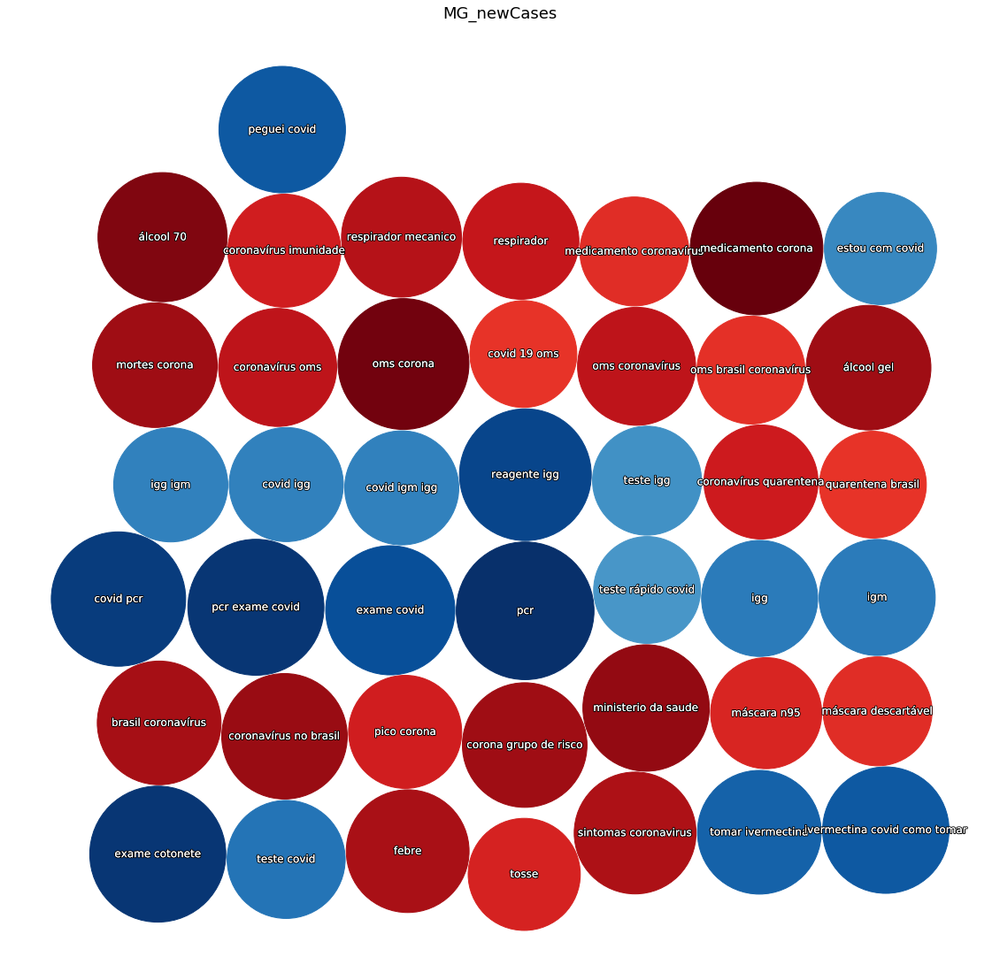

C:\Users\msart\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\Users\msart\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


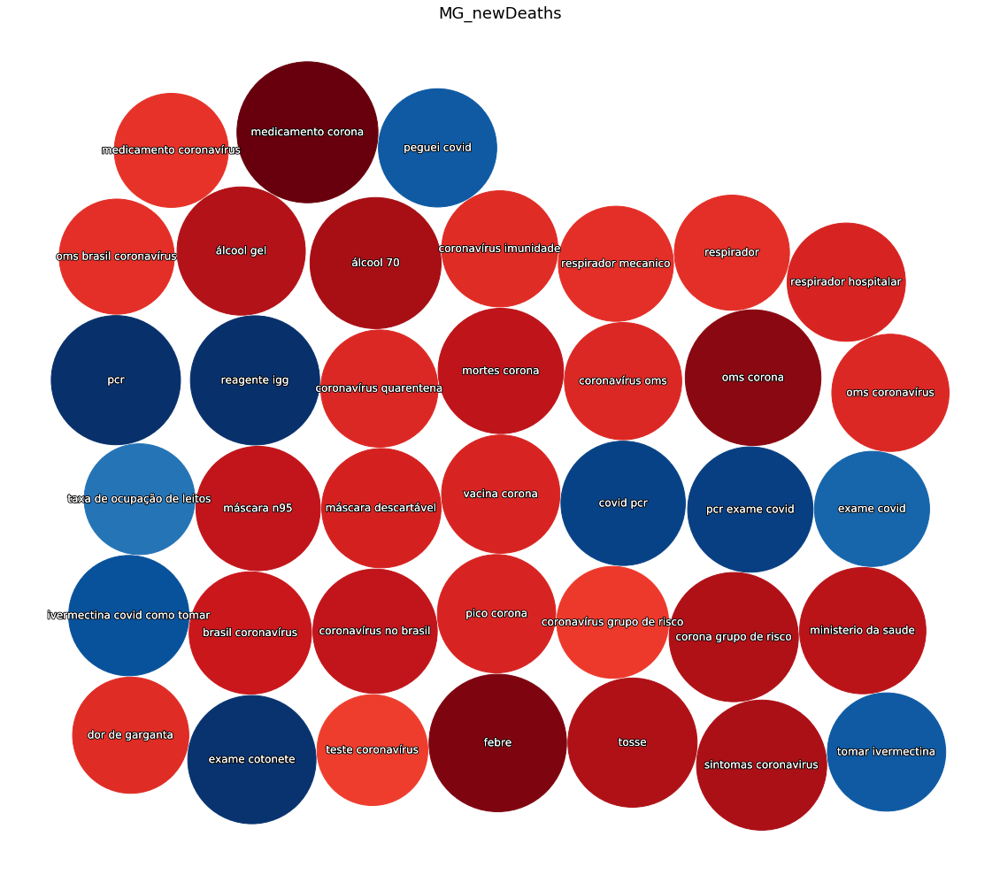

In [40]:
plotAll(spearmanCorr.copy())

In [41]:
#plotAll(pearsonCorr)

In [42]:
from wordcloud import WordCloud
from PIL import Image

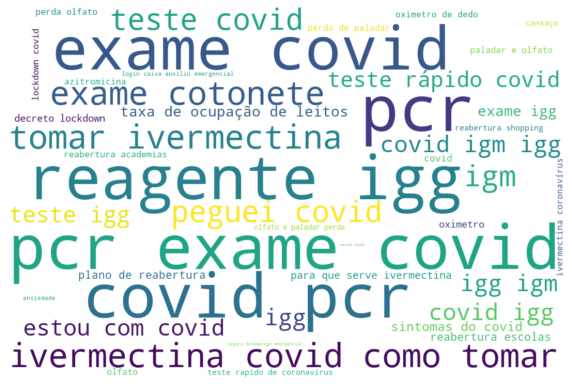

In [43]:
#exemplo de wordcloud sem formato definido
wc = WordCloud(background_color="white", max_words=124,width=1080,height=720)
wc.generate_from_frequencies(spearmanCorr['Brasil_newCases'].to_dict(),count)
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.show()

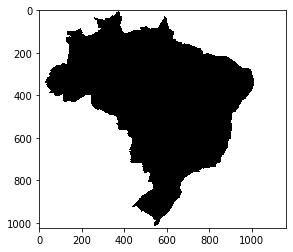

In [44]:
#a mask é a forma que a wordcloud abaixo irá aderir
brmask=np.array(Image.open("brmask.png"))
plt.imshow(brmask)

C:\Users\msart\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\Users\msart\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


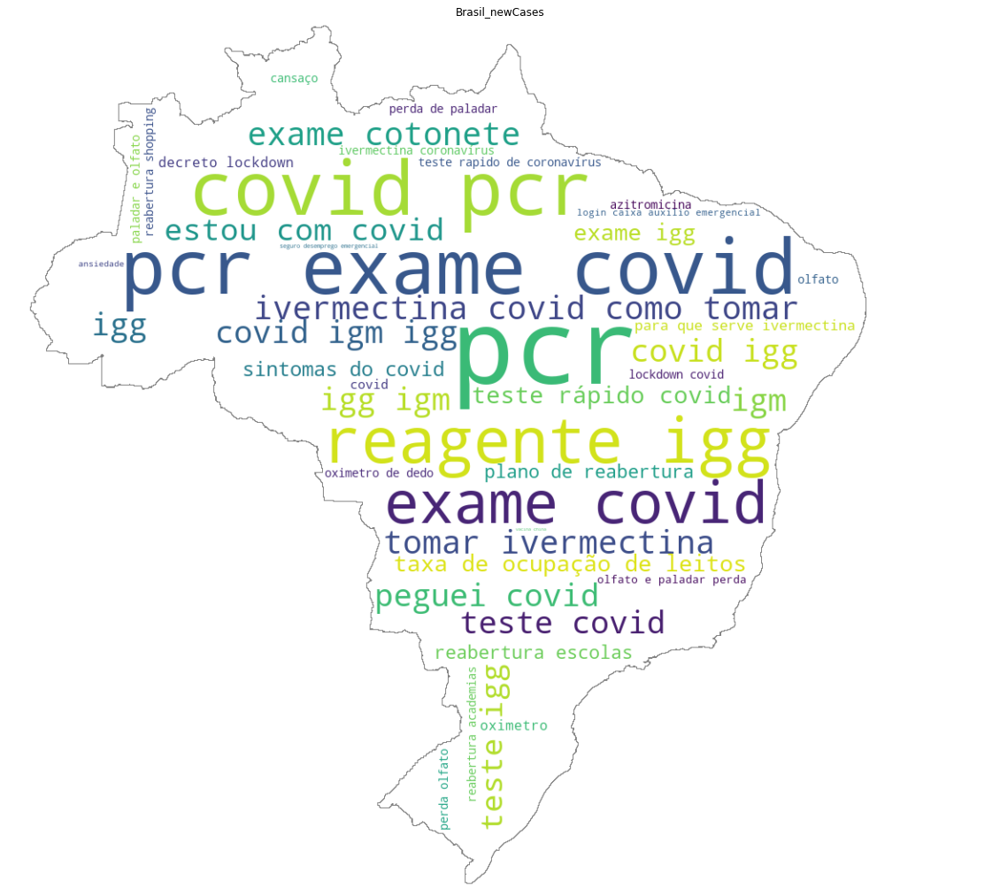

In [45]:
#exemplo de wordcloud no formato do brasil
col=color(spearmanCorr.copy(),'Brasil_newCases')
col=col['color']
wc = WordCloud(background_color="white", max_words=124,mask=brmask,contour_width=1, contour_color='gray')
wc.generate_from_frequencies(spearmanCorr['Brasil_newCases'].to_dict(),count)
fig, ax = plt.subplots(figsize=(20, 20))
plt.imshow(wc, interpolation="bilinear")
plt.title('Brasil_newCases')
plt.axis("off")
plt.show()

In [46]:
#criando pastas para salvar os wordclouds
parent_dir = os.getcwd()
path='Wordclouds'
path = os.path.join(parent_dir, path)
try:
    os.mkdir(path)
except:
    print('Pasta já existe')
path2=os.path.join(path,'Positivas')
try:
    os.mkdir(path2)
except:
    print('Pasta já existe')
path2=os.path.join(path,'Negativas')
try:
    os.mkdir(path2)
except:
    print('Pasta já existe')

Pasta já existe
Pasta já existe
Pasta já existe


In [47]:
spearmanCorr

,Brasil_newCases,Brasil_newDeaths,MG_newCases,MG_newDeaths
keyword,,,,
sintomas do covid,0.458870,0.446521,0.338576,0.124118
covid-19,-0.096498,0.250027,-0.231941,-0.230796
sintomas do covid 19,-0.010589,0.167467,-0.144789,-0.299502
dor de garganta,-0.377091,-0.451472,-0.417617,-0.553774
dor de cabeça,-0.076516,0.251889,-0.272439,-0.343495
...,...,...,...,...
respirador hospitalar,-0.372128,-0.165293,-0.473833,-0.570889
medicamento coronavírus,-0.403303,-0.090497,-0.520305,-0.539757
medicamento corona,-0.626747,-0.305754,-0.773571,-0.817209


In [48]:
#função que gera os wordclouds a partir de um dataframe(pandas dataframe),um indicador(string) e uma mask(array)
def wordcloud(corr,ind,Xmask):
    pos=corr[corr[ind]>=0][ind]
    neg=corr[corr[ind]<0][ind]
    wc = WordCloud(background_color="white", max_words=124,mask=Xmask,contour_width=1, contour_color='gray')
    wc.generate_from_frequencies(pos.to_dict(),count)
    fig, ax = plt.subplots(figsize=(20, 20))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(ind.replace('_',' ')+' positivo',fontsize='18')
    plt.text(0,len(Xmask),'*Posição das keywords no mapa não é indicativa do local no qual elas foram pesquisadas')
    plt.savefig('Wordclouds\\Positivas\\'+ind+'.png')
    plt.show()
    plt.clf()
    neg=abs(neg)
    wc = WordCloud(background_color="white", max_words=124,mask=Xmask,contour_width=1, contour_color='gray')
    wc.generate_from_frequencies(neg.to_dict(),count)
    fig, ax = plt.subplots(figsize=(20, 20))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(ind.replace('_',' ')+' negativo',fontsize='18')
    plt.text(0,len(Xmask),'*Posição das keywords no mapa não é indicativa do local no qual elas foram pesquisadas')
    plt.savefig('Wordclouds\\Negativas\\'+ind+'.png')
    plt.show()
    plt.clf()

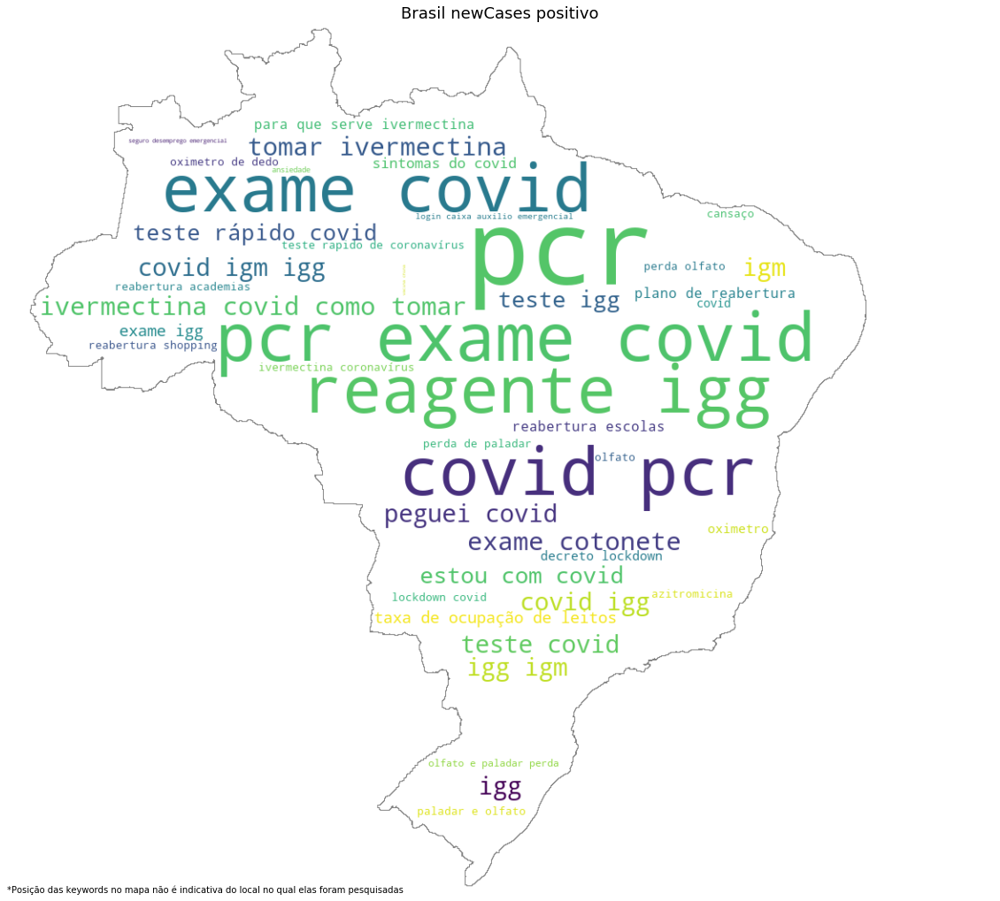

<Figure size 432x288 with 0 Axes>

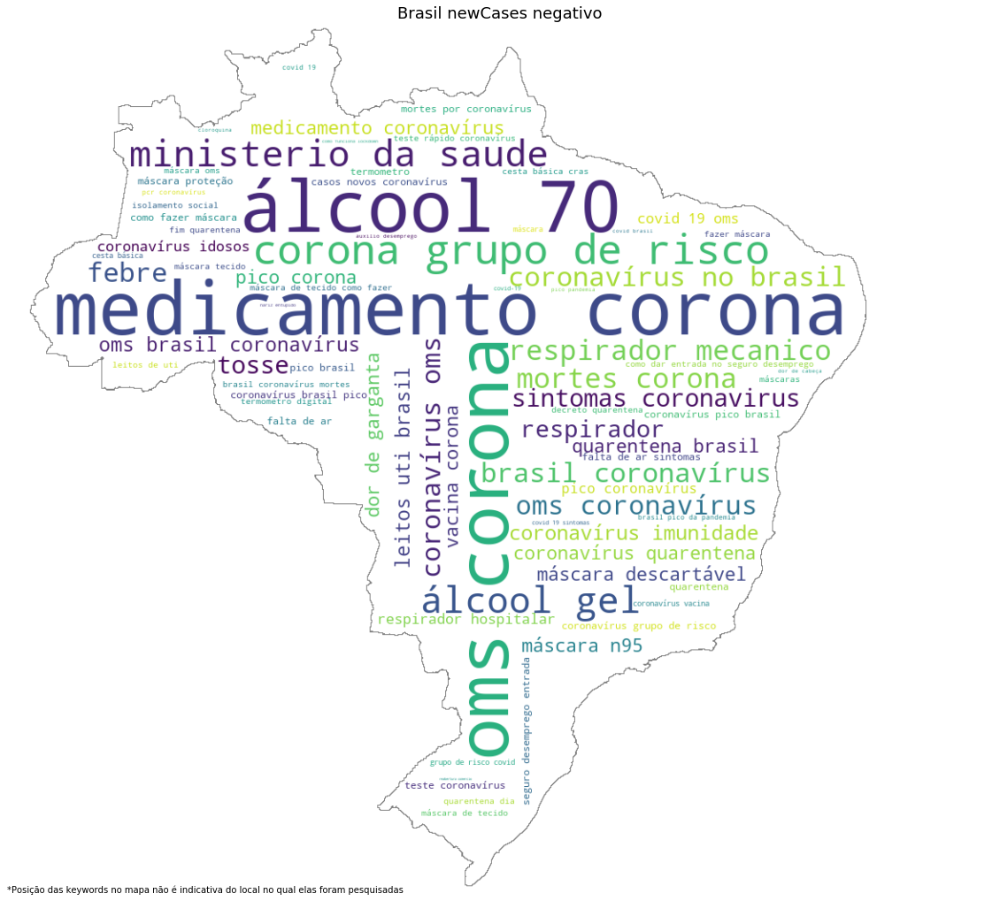

<Figure size 432x288 with 0 Axes>

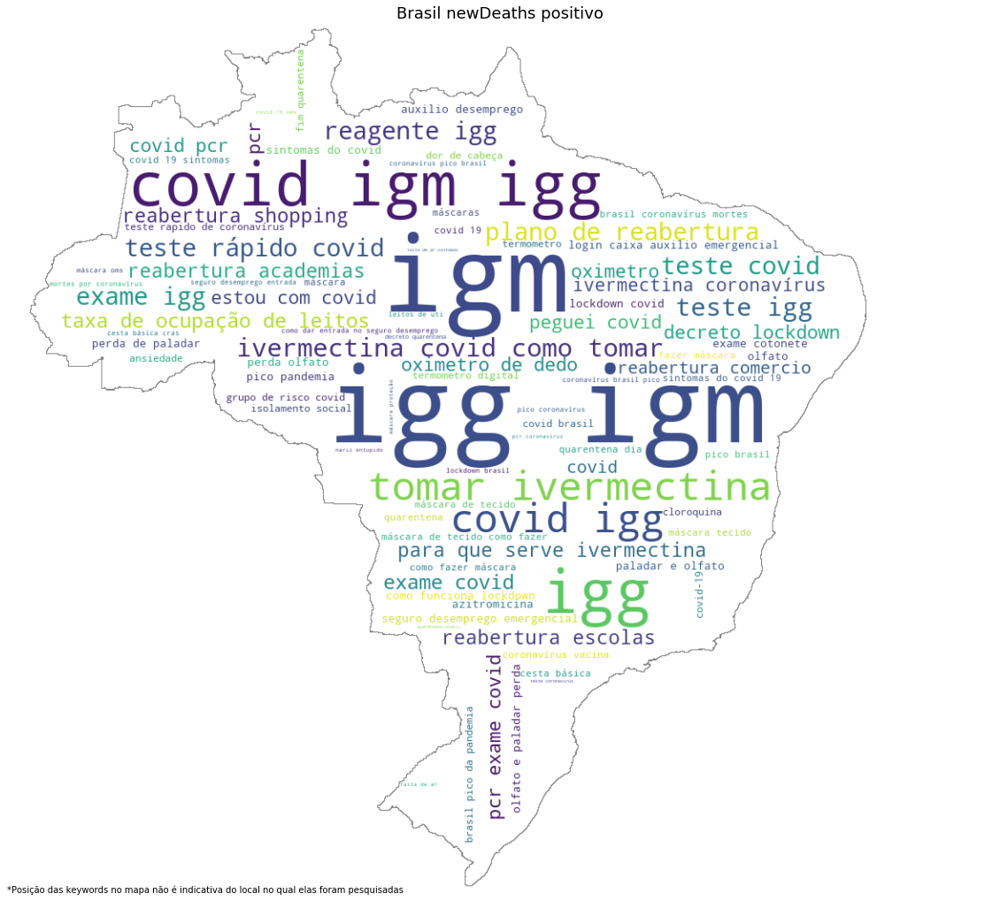

<Figure size 432x288 with 0 Axes>

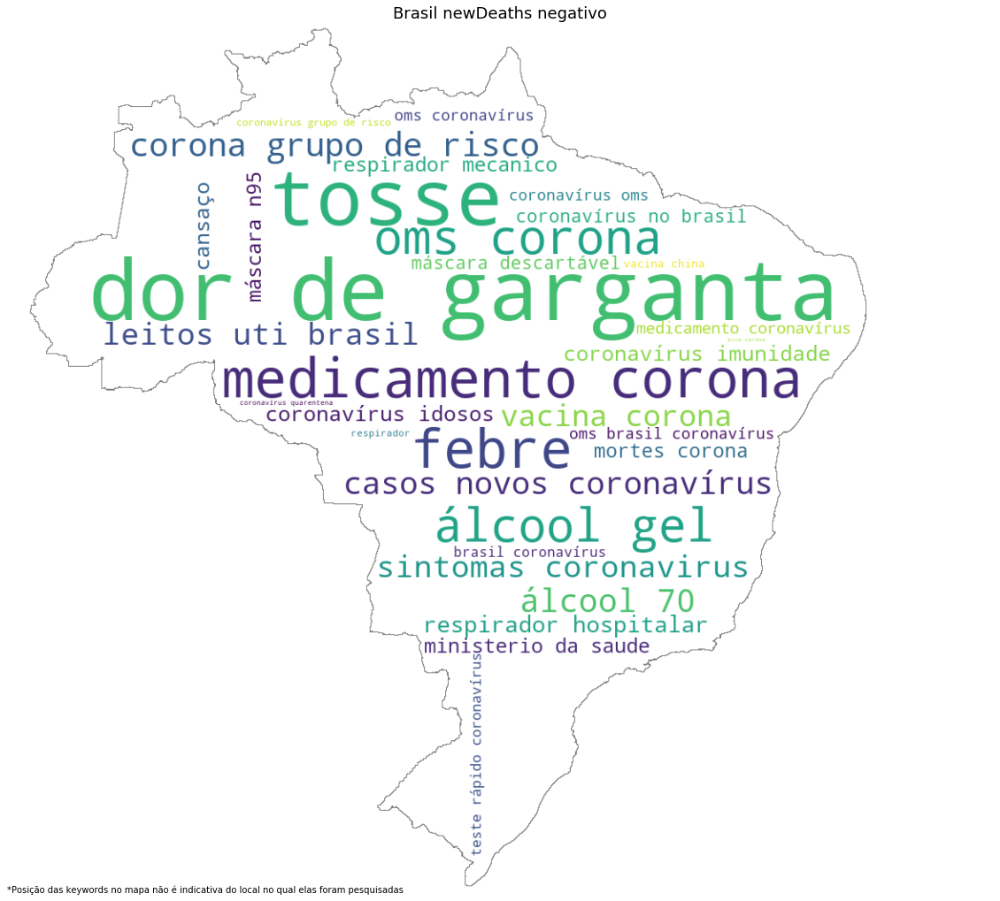

<Figure size 432x288 with 0 Axes>

In [49]:
#gerando wordclouds para brasil
wordcloud(spearmanCorr.copy(),'Brasil_newCases',brmask)
wordcloud(spearmanCorr.copy(),'Brasil_newDeaths',brmask)

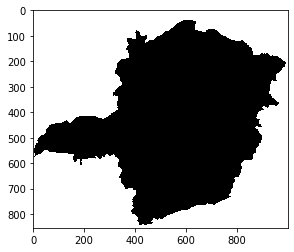

In [50]:
#a mask é a forma que a wordcloud MG irá aderir
mgmask=np.array(Image.open("mgmask.png"))
plt.imshow(mgmask)

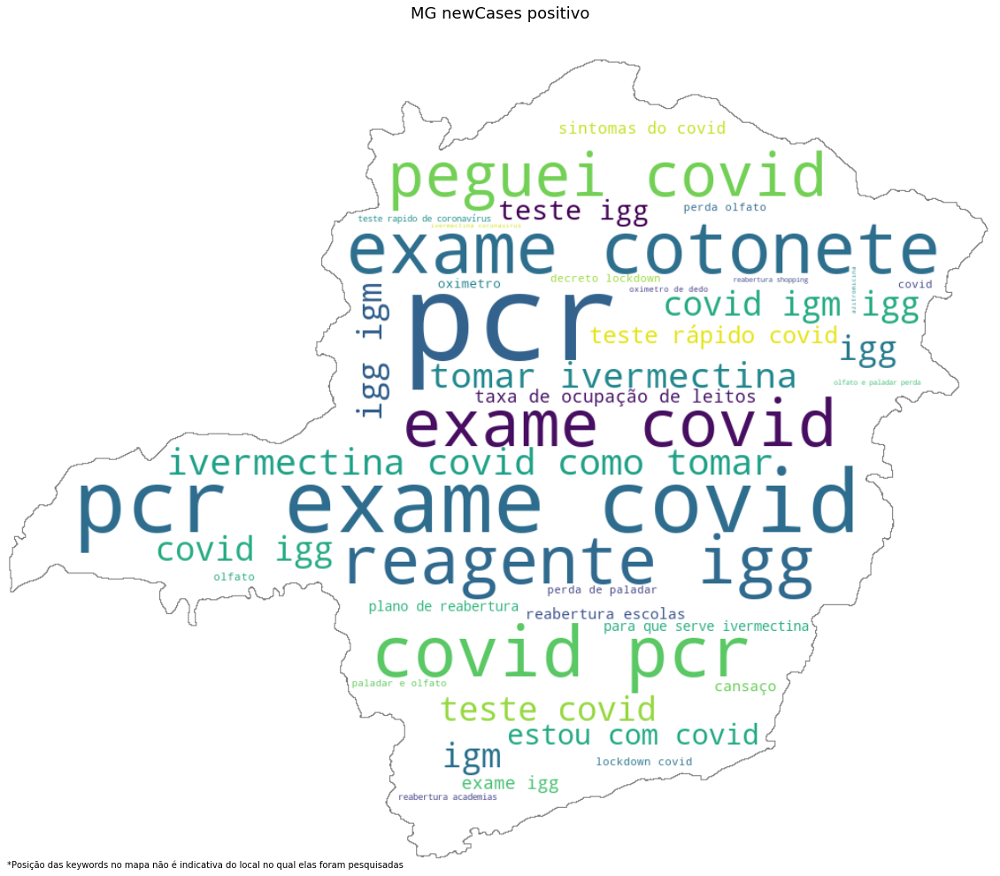

<Figure size 432x288 with 0 Axes>

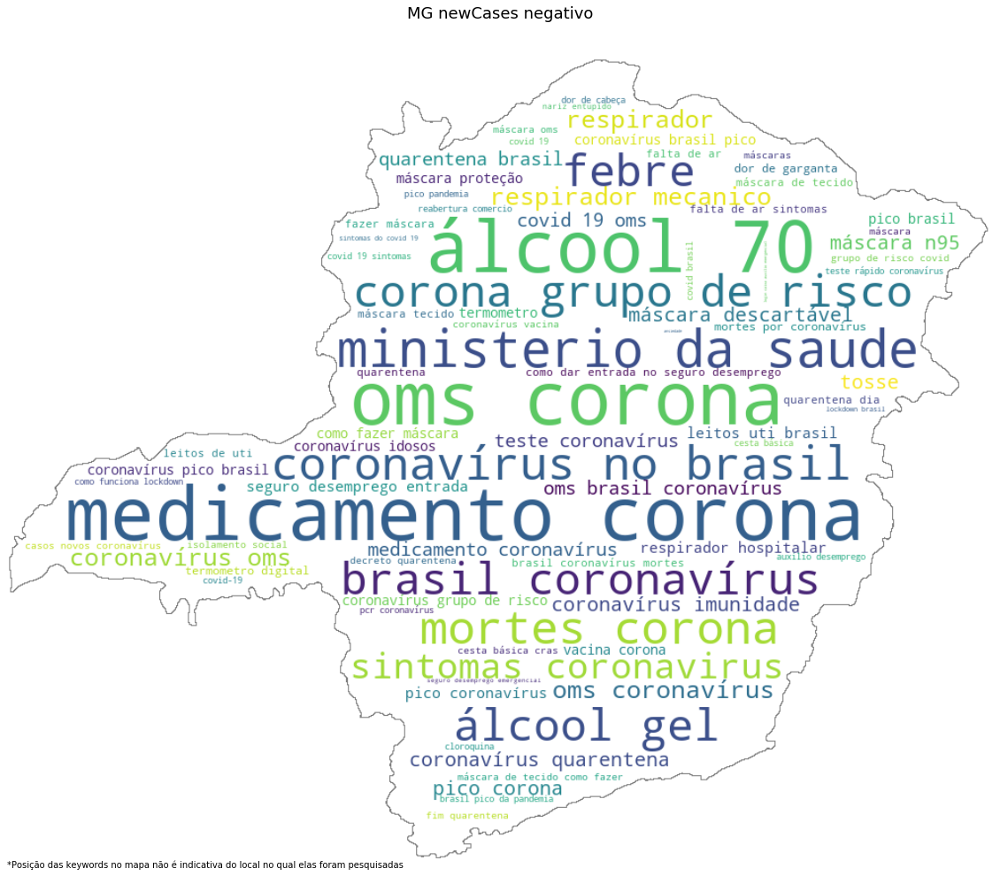

<Figure size 432x288 with 0 Axes>

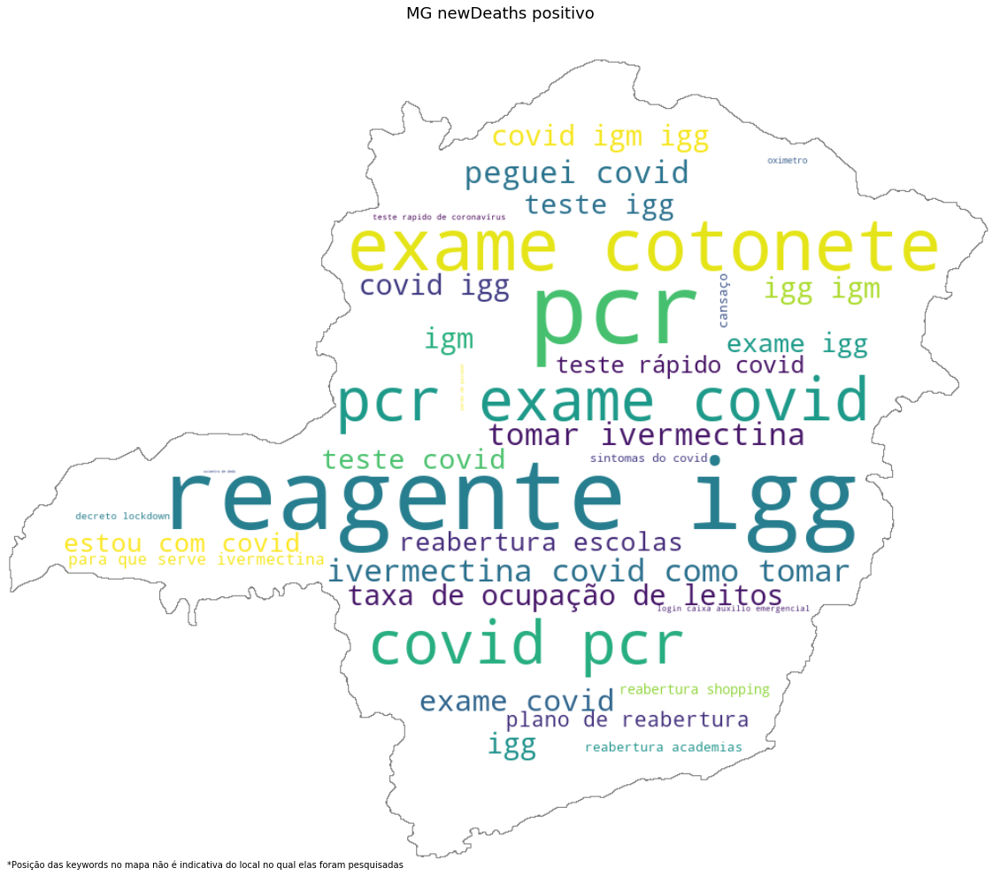

<Figure size 432x288 with 0 Axes>

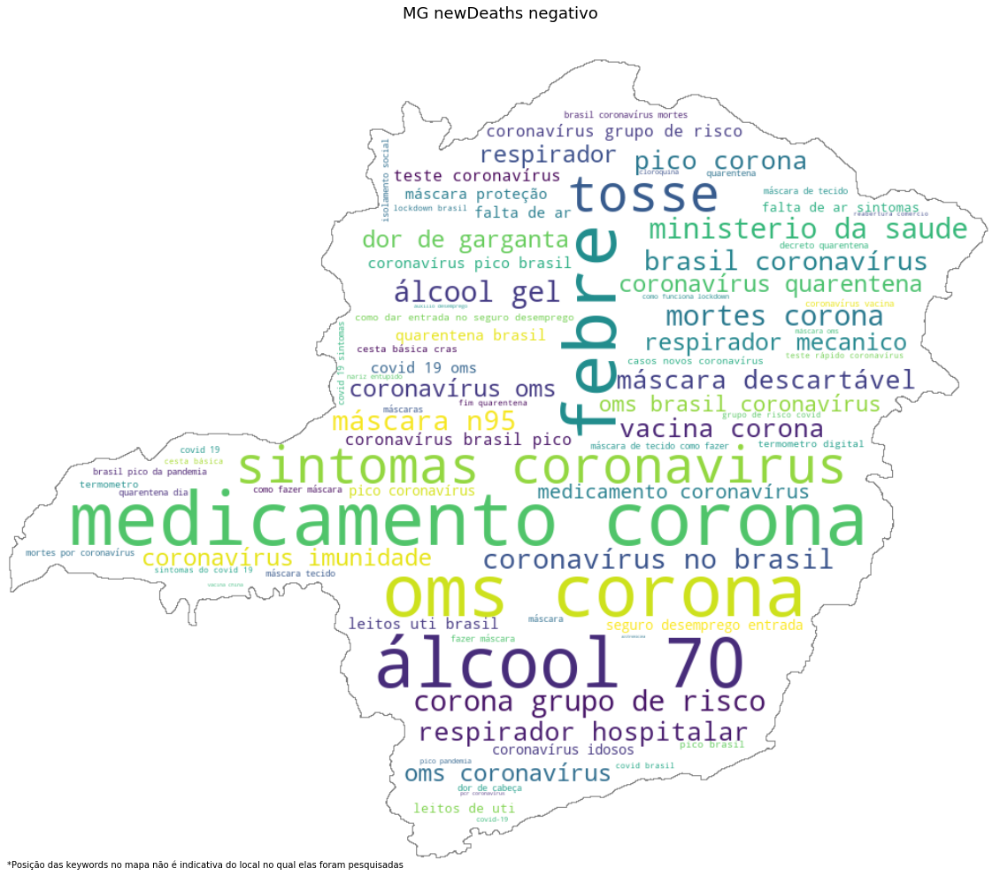

<Figure size 432x288 with 0 Axes>

In [51]:
#gerando wordclouds para minas gerais
wordcloud(spearmanCorr.copy(),'MG_newCases',mgmask)
wordcloud(spearmanCorr.copy(),'MG_newDeaths',mgmask)

In [52]:
#plotando os gerais
def wordcloudGeral(corr,ind,Xmask):
    corr=abs(corr)
    wc = WordCloud(background_color="white", max_words=124,mask=Xmask,contour_width=1, contour_color='gray')
    wc.generate_from_frequencies(corr[ind].to_dict(),count)
    fig, ax = plt.subplots(figsize=(20, 20))
    plt.imshow(wc, interpolation="bilinear")
    plt.title(ind.replace('_',' '),fontsize='18')
    plt.axis("off")
    plt.text(0,len(Xmask),'*Posição das keywords no mapa não é indicativa do local no qual elas foram pesquisadas')
    plt.savefig('Wordclouds\\'+ind+'.png')
    plt.show()
    plt.clf()

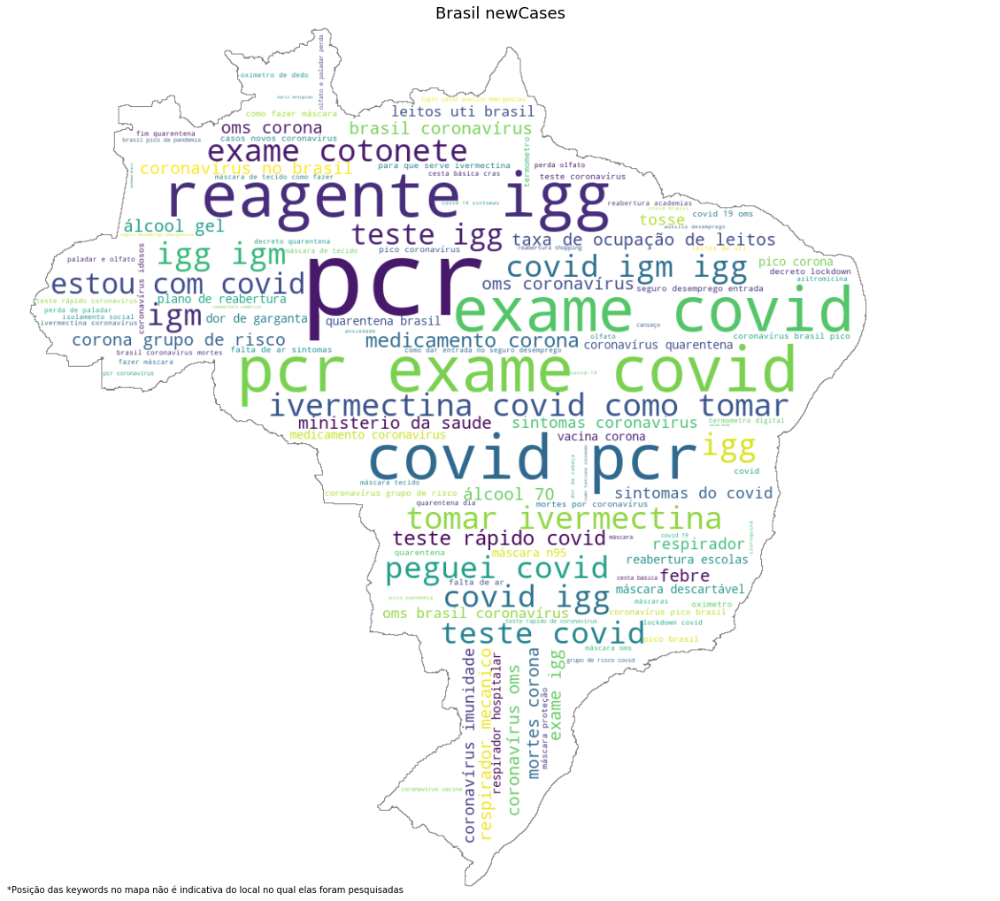

<Figure size 432x288 with 0 Axes>

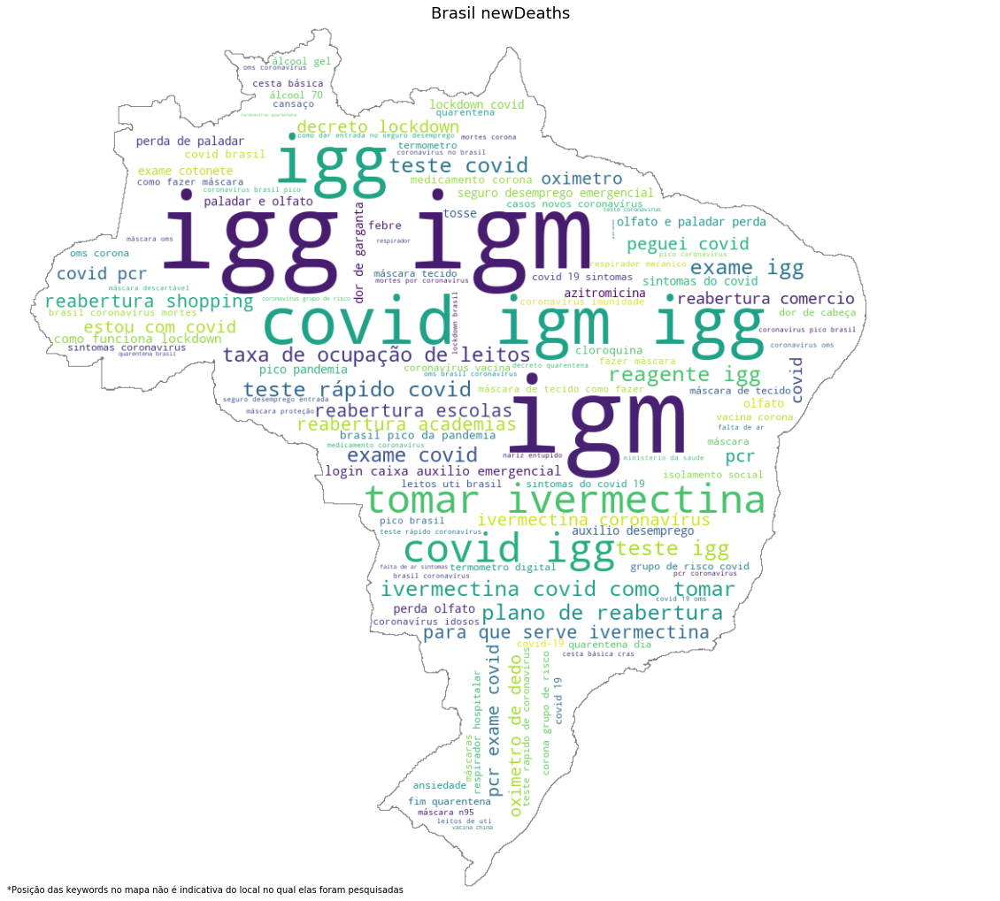

<Figure size 432x288 with 0 Axes>

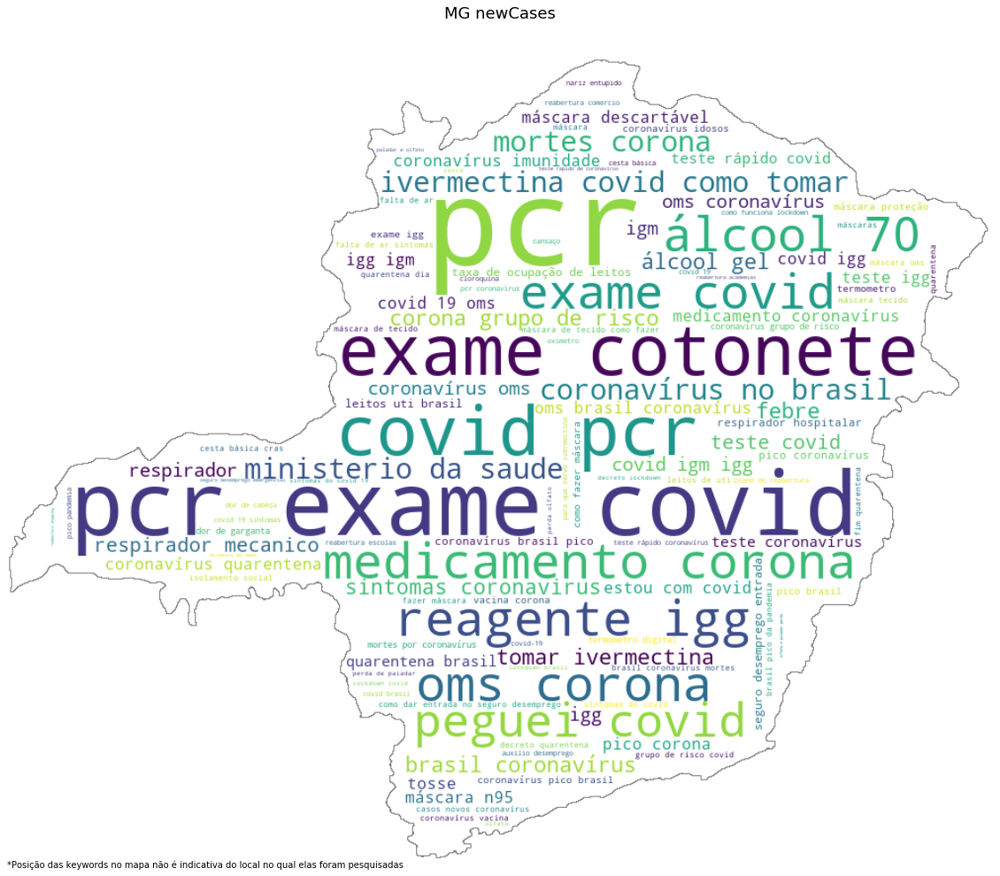

<Figure size 432x288 with 0 Axes>

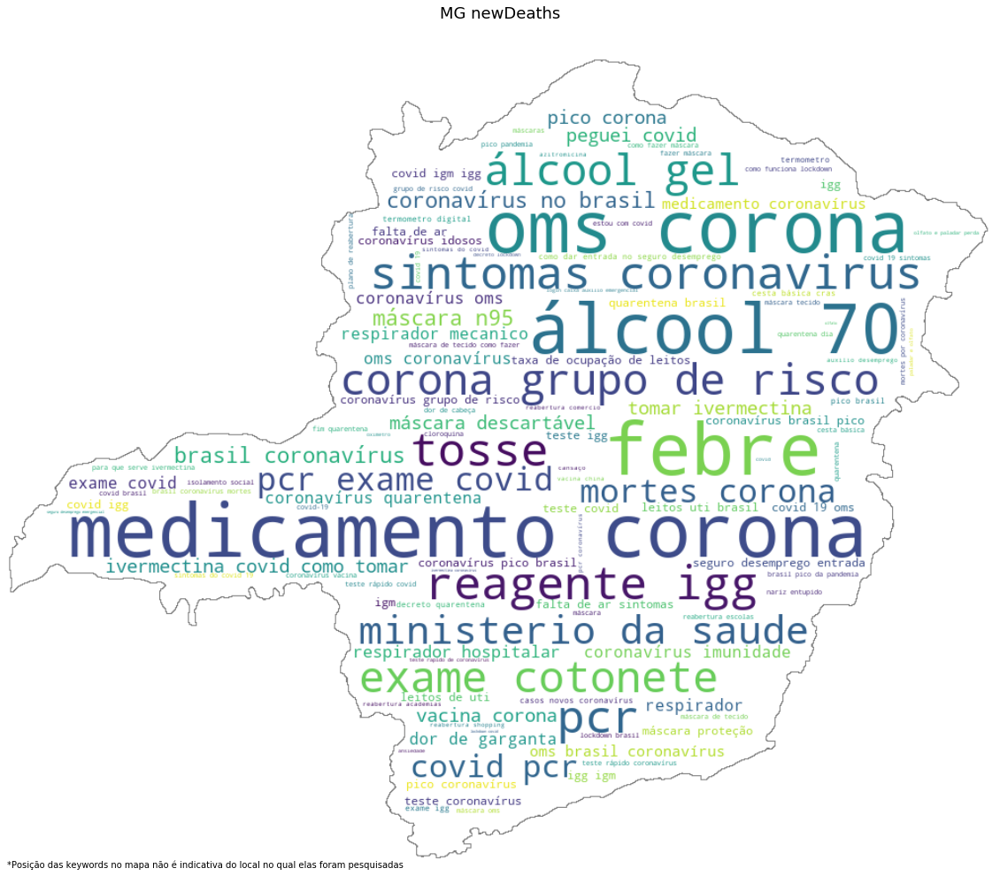

<Figure size 432x288 with 0 Axes>

In [53]:
wordcloudGeral(spearmanCorr.copy(),'Brasil_newCases',brmask)
wordcloudGeral(spearmanCorr.copy(),'Brasil_newDeaths',brmask)
wordcloudGeral(spearmanCorr.copy(),'MG_newCases',mgmask)
wordcloudGeral(spearmanCorr.copy(),'MG_newDeaths',mgmask)

In [54]:
def facet_wrap(dfKW,dfInd,ind,location,sintomas):
    fig, axs = plt.subplots(6, 3,figsize=(10,12))
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    for i in range(axs.shape[0]):
        for j in range(axs.shape[1]):
            axs[i,j].tick_params(axis='x',which='both',bottom=False,top=False, labelbottom=False)
    column=0
    row=0
    for i in sintomas['query']:
        axs[row,column].plot(dfKW[i],label='keyword')
        axs[row,column].plot(dfInd[ind],label=ind)
        axs[row,column].set_title(i)
        column+=1
        if(column==3):
            column=0
            row+=1
    fig.subplots_adjust(top=0.95, left=0.1, right=0.9, bottom=0.12)
    axs.flatten()[-2].legend(loc='upper center', bbox_to_anchor=(0.5, -0.12), ncol=3)
   # fig.suptitle('symptoms and '+ind+'('+location+')',fontweight='bold')
    plt.savefig('Sintomas\\'+location+ind)
    plt.show()
    plt.clf()

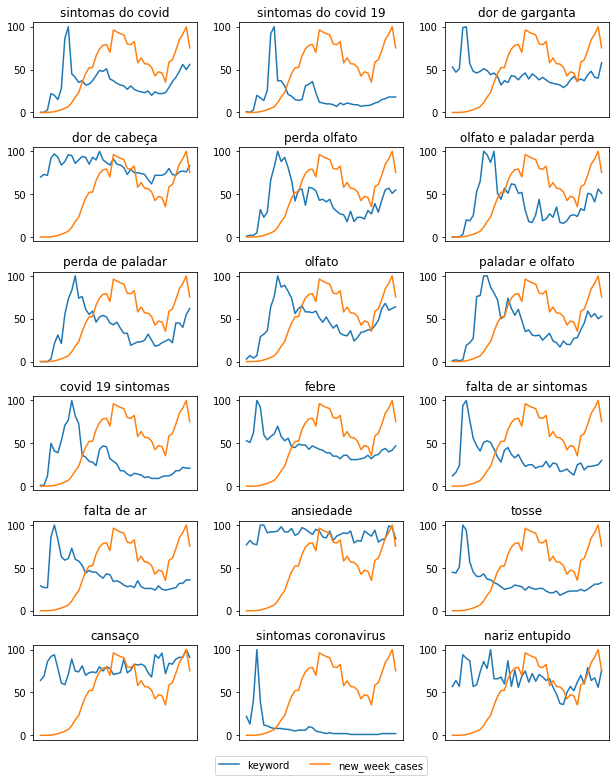

<Figure size 432x288 with 0 Axes>

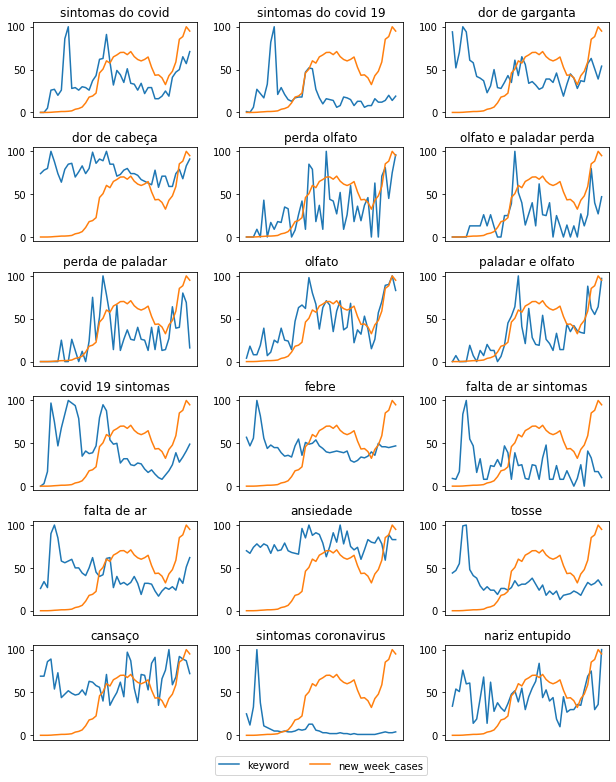

<Figure size 432x288 with 0 Axes>

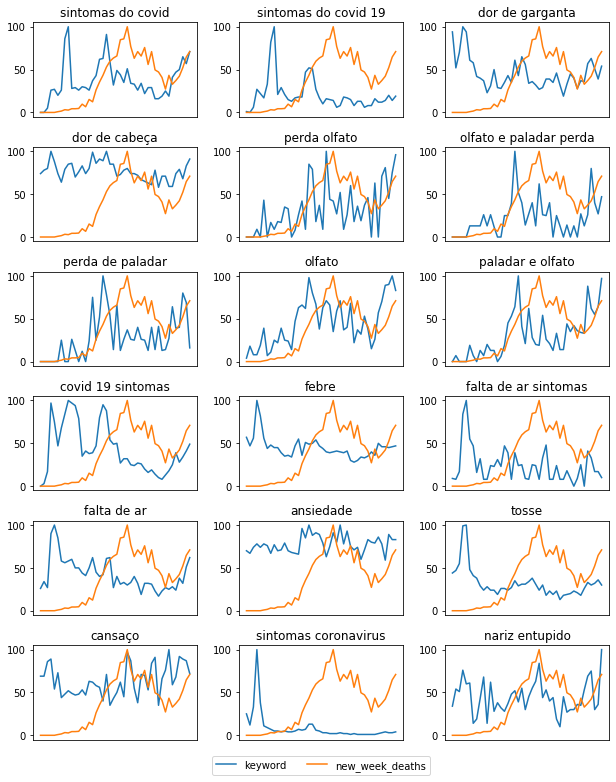

<Figure size 432x288 with 0 Axes>

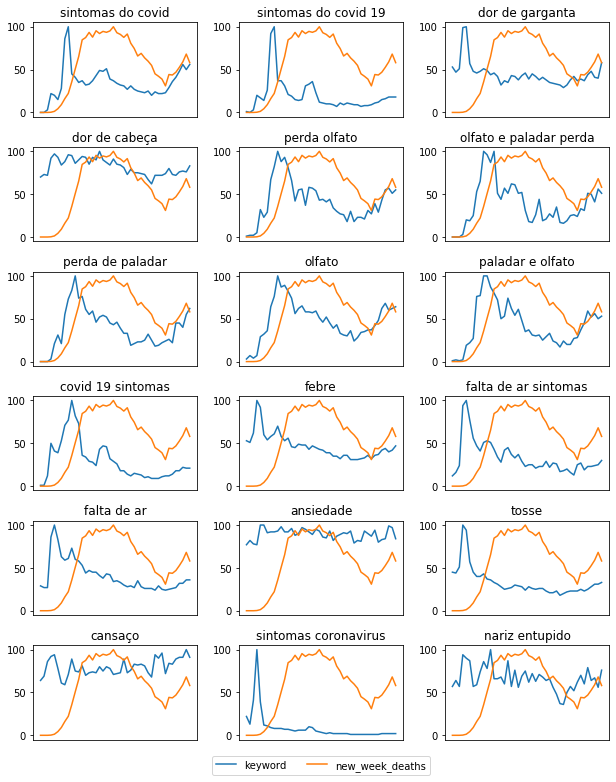

<Figure size 432x288 with 0 Axes>

In [55]:
facet_wrap(kwBR,brasilDf,'new_week_cases','BR',sintomas)
facet_wrap(kwMG,statesDf,'new_week_cases','MG',sintomas)
facet_wrap(kwMG,statesDf,'new_week_deaths','MG',sintomas)
facet_wrap(kwBR,brasilDf,'new_week_deaths','BR',sintomas)

In [56]:
def facet_wrapTop10(dfKW,sortedCorr,dfInd,ind,location):
    fig, axs = plt.subplots(5, 2,figsize=(10,12))
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    for i in range(axs.shape[0]):
        for j in range(axs.shape[1]):
            axs[i,j].tick_params(axis='x',which='both',bottom=False,top=False, labelbottom=False)
    column=0
    row=0
    sortedCorr=sortedCorr.reset_index()
    for i in sortedCorr['keyword']:
        axs[row,column].plot(dfKW[i],label='keyword')
        axs[row,column].plot(dfInd[ind],label=ind)
        axs[row,column].set_title(i)
        column+=1
        if(column==2):
            column=0
            row+=1
    fig.subplots_adjust(top=0.95, left=0.1, right=0.9, bottom=0.12)
    axs.flatten()[-2].legend(loc='upper center', bbox_to_anchor=(0.5, -0.12), ncol=3)
    #fig.suptitle('Top 10 Keywords and '+ind+'('+location+')',fontweight='bold')
    plt.savefig('Top10\\'+location+ind)
    plt.show()
    plt.clf()

In [57]:
#preparando as top10 keywords
sortedCorr=spearmanCorr.copy()
for i in sortedCorr:
    sortedCorr[i]=abs(sortedCorr[i])

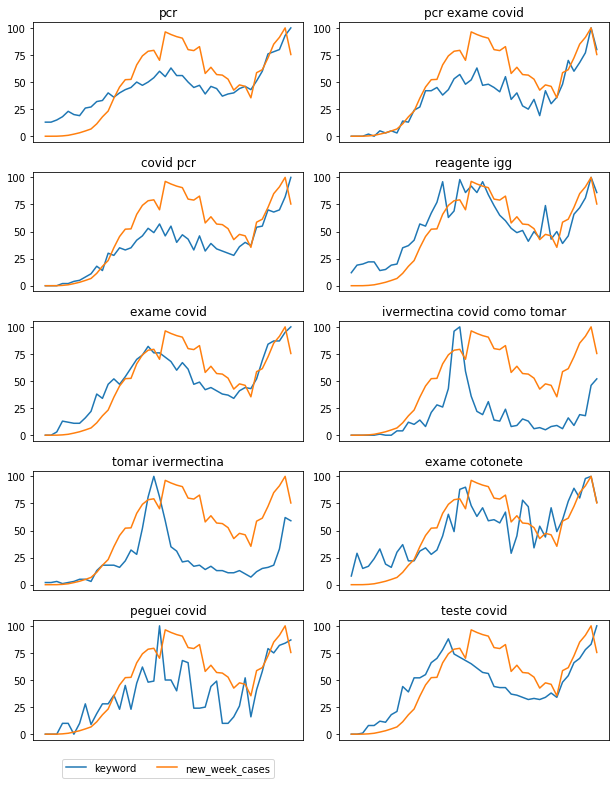

<Figure size 432x288 with 0 Axes>

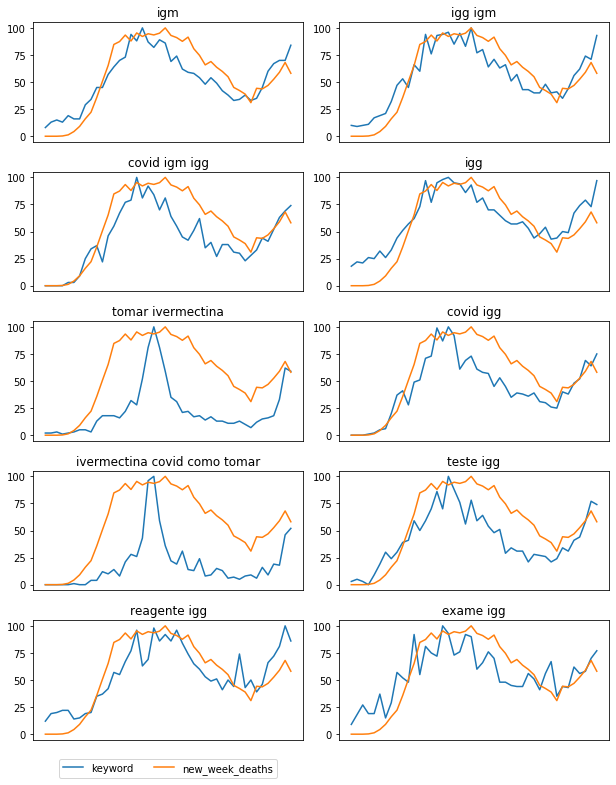

<Figure size 432x288 with 0 Axes>

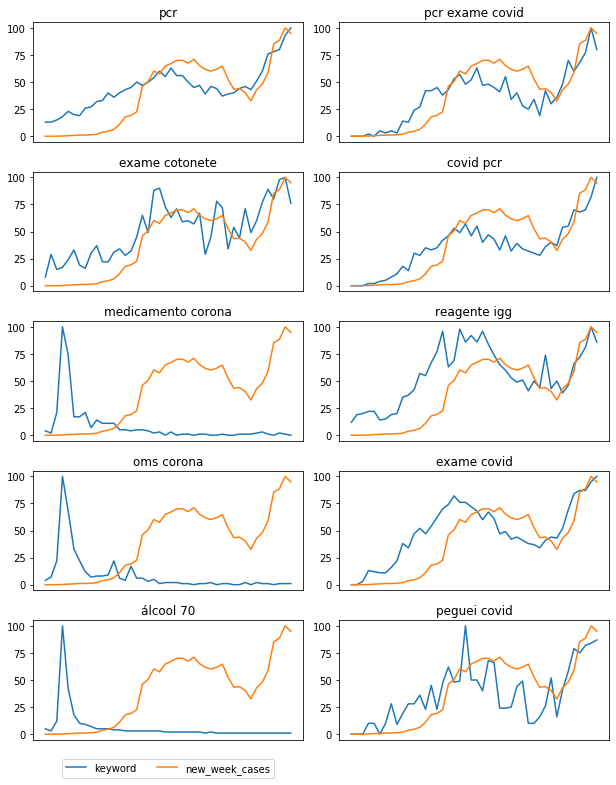

<Figure size 432x288 with 0 Axes>

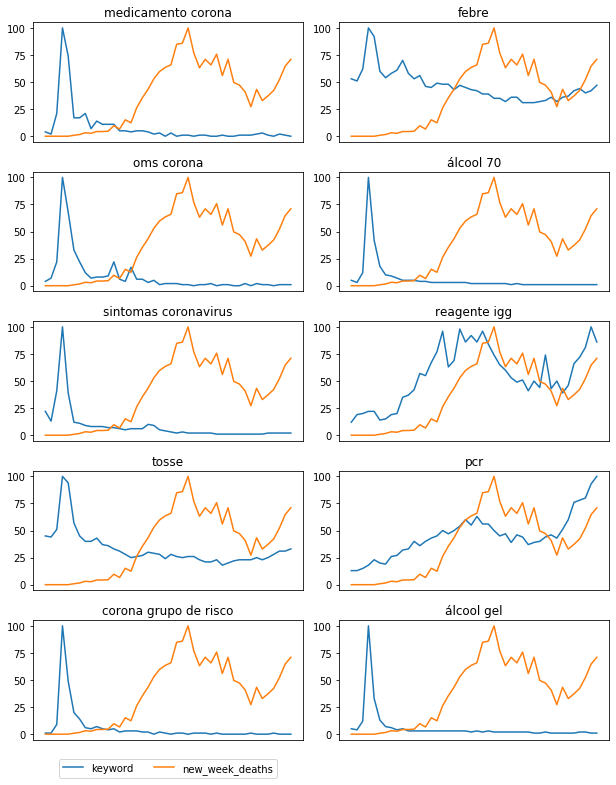

<Figure size 432x288 with 0 Axes>

In [58]:
facet_wrapTop10(kwBR,sortedCorr.sort_values(by='Brasil_newCases',ascending=False)[0:10],brasilDf,'new_week_cases','BR')
facet_wrapTop10(kwBR,sortedCorr.sort_values(by='Brasil_newDeaths',ascending=False)[0:10],brasilDf,'new_week_deaths','BR')
facet_wrapTop10(kwBR,sortedCorr.sort_values(by='MG_newCases',ascending=False)[0:10],statesDf,'new_week_cases','MG')
facet_wrapTop10(kwBR,sortedCorr.sort_values(by='MG_newDeaths',ascending=False)[0:10],statesDf,'new_week_deaths','MG')